# Playbook | Modeling Steps | DataFrames used

All the Snowflake tables used for this exercise has the following DataBase and Schema:

Database: **EDM_BIZOPS_PRD**
Schema: **FBI**

BNC to eCom Model Data Snowflake tablename: **NK_FRACTAL_BNC_TO_ECOM_EDA**

**Step1**: Import all the necessary libraries for modeling and define user defined functions and Read Data from Transactional table **NK_FRACTAL_BNC_TO_ECOM_EDA** in a spark Dataframe **df** **(Section 1)**

**Step2**: Convert spark **df** to python **pd_df** dataframe 

          a. Remove correlated features from **pd_df** and create **df_final_churn** which doesn't have any correlated feature

          b. Create Dummy variables for discrete features - **dummy_data** - This dataframe will be used for modeling purpose

**(Section 2.a)**


**Step3**: Define Target and Independent features and create a baseline model with **dummy_data** **(Section 2.b and 2.c)**

**Step4**: Run the model and other necessary steps **(Section 2.d)**

**Step5**: EDA for the important features **(Section 2.e)**

# 1. Import Libraries and connect to Snowflake

### Installing libraries

In [0]:
%pip install xgboost
%pip install shap
#%pip install nltk
%pip install pydotplus
%pip install graphviz
#%pip install python-pydot python-pydot-ng graphviz
from sklearn.tree import export_graphviz

#import nltk
#import sklearn

#print('The nltk version is {}.'.format(nltk.__version__))
#print('The scikit-learn version is {}.'.format(sklearn.__version__))

# The nltk version is 3.0.0.
# The scikit-learn version is 0.15.2.

Python interpreter will be restarted.
Collecting xgboost
 Downloading xgboost-2.0.2-py3-none-manylinux2014_x86_64.whl (297.1 MB)
Requirement already satisfied: numpy in /databricks/python3/lib/python3.8/site-packages (from xgboost) (1.20.1)
Requirement already satisfied: scipy in /databricks/python3/lib/python3.8/site-packages (from xgboost) (1.6.2)
Installing collected packages: xgboost
Successfully installed xgboost-2.0.2
Python interpreter will be restarted.
Python interpreter will be restarted.
Collecting shap
 Downloading shap-0.43.0-cp38-cp38-manylinux_2_12_x86_64.manylinux2010_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (535 kB)
Requirement already satisfied: scikit-learn in /databricks/python3/lib/python3.8/site-packages (from shap) (0.24.1)
Collecting cloudpickle
 Downloading cloudpickle-3.0.0-py3-none-any.whl (20 kB)
Collecting numba
 Downloading numba-0.58.1-cp38-cp38-manylinux2014_x86_64.manylinux_2_17_x86_64.whl (3.7 MB)
Requirement already satisfied: scipy in /databricks/python3/lib/python3.8/site-packages (from shap) (1.6.2)
Collecting packaging>20.9
 Downloading packaging-23.2-py3-none-any.whl (53 kB)
Collecting slicer==0.0.7
 Downloading slicer-0.0.7-py3-none-any.whl (14 kB)
Collecting tqdm>=4.27.0
 Downloading tqdm-4.66.1-py3-none-any.whl (78 kB)
Requirement already satisfied: pandas in /databricks/python3/lib/python3.8/site-packages (from shap) (1.2.4)
Requirement already satisfied: numpy in /databricks/python3/lib/python3.8/site-packages (from shap) (1.20.1)
Collecting importlib-metadata
 Downloading importlib_metadata-6.8.0-py3-none-any.whl (22 kB)
Collecting numpy
 Downloading numpy-1.24.4-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)
Collecting llvmlite<0.42,>=0.41.0dev0
 Downloading llvmlite-0.41.1-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (43.6 MB)
Collecting zipp>=0.5
 Downloading zipp-3.17.0-py3-none-any.whl (7.4 kB)
Requirement already satisfied: pytz>=2017.3 in /databricks/python3/lib/python3.8/site-packages (from pandas->shap) (2020.5)
Requirement already satisfied: python-dateutil>=2.7.3 in /databricks/python3/lib/python3.8/site-packages (from pandas->shap) (2.8.1)
Requirement already satisfied: six>=1.5 in /databricks/python3/lib/python3.8/site-packages (from python-dateutil>=2.7.3->pandas->shap) (1.15.0)
Requirement already satisfied: joblib>=0.11 in /databricks/python3/lib/python3.8/site-packages (from scikit-learn->shap) (1.0.1)
Requirement already satisfied: threadpoolctl>=2.0.0 in /databricks/python3/lib/python3.8/site-packages (from scikit-learn->shap) (2.1.0)
Collecting numpy
 Downloading numpy-1.22.4-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.9 MB)
Installing collected packages: zipp, numpy, llvmlite, importlib-metadata, tqdm, slicer, packaging, numba, cloudpickle, shap
 Attempting uninstall: numpy
 Found existing installation: numpy 1.20.1
 Not uninstalling numpy at /databricks/python3/lib/python3.8/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-0e74790a-a4cf-46ca-9ace-46066b80ca24
 Can't uninstall 'numpy'. No files were found to uninstall.
 Attempting uninstall: packaging
 Found existing installation: packaging 20.9
 Not uninstalling packaging at /databricks/python3/lib/python3.8/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-0e74790a-a4cf-46ca-9ace-46066b80ca24
 Can't uninstall 'packaging'. No files were found to uninstall.
Successfully installed cloudpickle-3.0.0 importlib-metadata-6.8.0 llvmlite-0.41.1 numba-0.58.1 numpy-1.22.4 packaging-23.2 shap-0.43.0 slicer-0.0.7 tqdm-4.66.1 zipp-3.17.0
Python interpreter will be restarted.
Python interpreter will be restarted.
Collecting pydotplus
 Downloading pydotplus-2.0.2.tar.gz (278 kB)
Requirement already satisfied: pyparsing>=2.0.1 in /databricks/python3/lib/python3.8/site-packages (from pydotplus) (2.4.7)
Building wheels for collected packages: pydotplus
 Building wheel for pydotplus (setup.py): started
 Building

### Import libraries

In [0]:
# This will help in making the Python code more structured automatically (good coding practice)
# %load_ext nb_black
import warnings

warnings.filterwarnings("ignore")

# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd
from numpy import sqrt
from numpy import argmax

# Library to split data
from sklearn.model_selection import train_test_split

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 100)


# Libraries different ensemble classifiers
from sklearn.ensemble import (
    BaggingClassifier,
    RandomForestClassifier,
    AdaBoostClassifier,
    GradientBoostingClassifier,
    StackingClassifier,
)

from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn import tree

# Regression models
from sklearn.linear_model import LogisticRegression

# Libraries to get different metric scores
from sklearn import metrics
from sklearn.metrics import (
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
)

# Scale data
from sklearn.preprocessing import StandardScaler, MinMaxScaler 

# To tune different models
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
import shap

# Model evaluation
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.calibration import calibration_curve

#Visualization
from matplotlib import pyplot
from sklearn.tree import export_graphviz


In [0]:
# Import packages
# For data manipulation
from pyspark.sql.types import FloatType, IntegerType, StringType, BooleanType, BinaryType, DoubleType
from pyspark.sql.functions import col
from pyspark.sql.functions import when
import pyspark.sql.functions as f
from pyspark.sql.functions import count_distinct
import warnings
warnings.filterwarnings("ignore")
#from  import *
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline


## For modeling
from pyspark.ml.linalg import Vectors
from pyspark.ml.feature import OneHotEncoder, StringIndexer
from pyspark.sql import SparkSession
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.classification import LogisticRegression
from pyspark.ml import Pipeline 
from pyspark.ml.tuning import ParamGridBuilder,CrossValidator
from pyspark.ml.evaluation import BinaryClassificationEvaluator

## Functions

In [0]:
#First get Decile columns for all numerical vars according to specific universe
def get_decile_mark(data, metrics):
  for i in metrics:
    if i in ['LAST_TXN_WAIT_TIME']:
      data[i] = data[i].astype(float)
      subset1 = data[data['LAST_TXN_DELIVERY_TYPE']=='DELIVERY'] 
      subset2 = data[(data['LAST_TXN_DELIVERY_TYPE']=='DUG')&(data[i]==0)] 
      subset3 = data[(data['LAST_TXN_DELIVERY_TYPE']=='DUG')&(data[i]!=0)]

      subset1[i] = 'NA'
      subset2[i] = '00'
      if len(subset3) == 1:
        subset3[i] = '01'
      elif len(subset3)>1:
        subset3[i] = pd.qcut(subset3[i].rank(method='first'), 10, ['01','02','03','04','05', '06', '07', '08', '09', '10'])

      inter = subset1[i].append(subset2[i], ignore_index=False)
      data[i] = inter.append(subset3[i], ignore_index=False)

    elif i in ['LAST_TXN_DRIVE_DISTANCE']:
      data[i] = data[i].astype(float)
      subset1 = data[data['LAST_TXN_DELIVERY_TYPE']=='DUG'] 
      subset2 = data[(data['LAST_TXN_DELIVERY_TYPE']=='DELIVERY')&(data[i]==0)] 
      subset3 = data[(data['LAST_TXN_DELIVERY_TYPE']=='DELIVERY')&(data[i]!=0)]

      subset1[i] = 'NA'
      subset2[i] = '00'
      if len(subset3) == 1:
        subset3[i] = '01'
      elif len(subset3)>1:
        subset3[i] = pd.qcut(subset3[i].rank(method='first'), 10, ['01','02','03','04','05', '06', '07', '08', '09', '10'])

      inter = subset1[i].append(subset2[i], ignore_index=False)
      data[i] = inter.append(subset3[i], ignore_index=False)
    
    else:
      data[i] = data[i].astype(float)

      subset2 = data[(data[i]==0)] 
      subset3 = data[(data[i]!=0)]

      subset2[i] = '00'
      if len(subset3) == 1:
        subset3[i] = '01'
      elif len(subset3)>1:
        subset3[i] = pd.qcut(subset3[i].rank(method='first'), 10, ['01','02','03','04','05', '06', '07', '08', '09', '10'])

      data[i] = subset2[i].append(subset3[i], ignore_index=False)

  return data

In [0]:
#First get Decile columns for all numerical vars according to specific universe
def get_decile_mark_v4(data, metrics, result):
  for i in metrics:
    print(i)
    data[i] = data[i].astype(float)
    subset2 = data[(data[i]==0)] 
    subset3 = data[(data[i]!=0)]

    if len(subset3)>1:
      q1 = np.percentile(subset3[i], 25)
      q2 = np.percentile(subset3[i], 50)
      q3 = np.percentile(subset3[i], 75)
      q4 = np.percentile(subset3[i], 100)
      
      q1_data = subset3.loc[(subset3[i] <= q1)]
      q2_data = subset3.loc[(subset3[i] > q1)&(subset3[i] <= q2)]
      q3_data = subset3.loc[(subset3[i] > q2)&(subset3[i] <= q3)]
      q4_data = subset3.loc[(subset3[i] > q3)&(subset3[i] <= q4)]

      q0_per = 0
      if len(subset2)>0:
        q0_per = len(subset2[subset2['ECOM_CHURN_FLAG'] == 'True'])/len(subset2)
      q1_per = 0
      if len(q1_data)>0:
        q1_per = len(q1_data[q1_data['ECOM_CHURN_FLAG'] == 'True'])/len(q1_data)
      q2_per = 0
      if len(q2_data)>0:
        q2_per = len(q2_data[q2_data['ECOM_CHURN_FLAG'] == 'True'])/len(q2_data)
      q3_per = 0
      if len(q3_data)>0:
        q3_per = len(q3_data[q3_data['ECOM_CHURN_FLAG'] == 'True'])/len(q3_data)
      q4_per = 0
      if len(q4_data)>0:
        q4_per = len(q4_data[q4_data['ECOM_CHURN_FLAG'] == 'True'])/len(q4_data)

      result.loc[len(result)] = [i,'00',0,len(subset2),len(subset2[subset2['ECOM_CHURN_FLAG'] == 'True']),q0_per]
      result.loc[len(result)] = [i,'01',q1,len(q1_data),len(q1_data[q1_data['ECOM_CHURN_FLAG'] == 'True']),q1_per]
      result.loc[len(result)] = [i,'02',q2,len(q2_data),len(q2_data[q2_data['ECOM_CHURN_FLAG'] == 'True']),q2_per]
      result.loc[len(result)] = [i,'03',q3,len(q3_data),len(q3_data[q3_data['ECOM_CHURN_FLAG'] == 'True']),q3_per]
      result.loc[len(result)] = [i,'04',q4,len(q4_data),len(q4_data[q4_data['ECOM_CHURN_FLAG'] == 'True']),q4_per]


  return result

In [0]:
#First get Decile columns for all numerical vars according to specific universe
def get_decile_mark_v10(data, metrics, result):
  for i in metrics:
    print(i)
    data[i] = data[i].astype(float)
    subset2 = data[(data[i]==0)] 
    subset3 = data[(data[i]!=0)]

    if len(subset3)>1:
      q1 = np.percentile(subset3[i], 10)
      q2 = np.percentile(subset3[i], 20)
      q3 = np.percentile(subset3[i], 30)
      q4 = np.percentile(subset3[i], 40)
      q5 = np.percentile(subset3[i], 50)
      q6 = np.percentile(subset3[i], 60)
      q7 = np.percentile(subset3[i], 70)
      q8 = np.percentile(subset3[i], 80)
      q9 = np.percentile(subset3[i], 90)
      q10 = np.percentile(subset3[i], 100)
      
      q1_data = subset3.loc[(subset3[i] <= q1)]
      q2_data = subset3.loc[(subset3[i] > q1)&(subset3[i] <= q2)]
      q3_data = subset3.loc[(subset3[i] > q2)&(subset3[i] <= q3)]
      q4_data = subset3.loc[(subset3[i] > q3)&(subset3[i] <= q4)]
      q5_data = subset3.loc[(subset3[i] > q4)&(subset3[i] <= q5)]
      q6_data = subset3.loc[(subset3[i] > q5)&(subset3[i] <= q6)]
      q7_data = subset3.loc[(subset3[i] > q6)&(subset3[i] <= q7)]
      q8_data = subset3.loc[(subset3[i] > q7)&(subset3[i] <= q8)]
      q9_data = subset3.loc[(subset3[i] > q8)&(subset3[i] <= q9)]
      q10_data = subset3.loc[(subset3[i] > q9)]

      q0_per = 0
      if len(subset2)>0:
        q0_per = len(subset2[subset2['ECOM_CHURN_FLAG'] == 'True'])/len(subset2)
      q1_per = 0
      if len(q1_data)>0:
        q1_per = len(q1_data[q1_data['ECOM_CHURN_FLAG'] == 'True'])/len(q1_data)
      q2_per = 0
      if len(q2_data)>0:
        q2_per = len(q2_data[q2_data['ECOM_CHURN_FLAG'] == 'True'])/len(q2_data)
      q3_per = 0
      if len(q3_data)>0:
        q3_per = len(q3_data[q3_data['ECOM_CHURN_FLAG'] == 'True'])/len(q3_data)
      q4_per = 0
      if len(q4_data)>0:
        q4_per = len(q4_data[q4_data['ECOM_CHURN_FLAG'] == 'True'])/len(q4_data)
      q5_per = 0
      if len(q5_data)>0:
        q5_per = len(q5_data[q5_data['ECOM_CHURN_FLAG'] == 'True'])/len(q5_data)
      q6_per = 0
      if len(q6_data)>0:
        q6_per = len(q6_data[q6_data['ECOM_CHURN_FLAG'] == 'True'])/len(q6_data)
      q7_per = 0
      if len(q7_data)>0:
        q7_per = len(q7_data[q7_data['ECOM_CHURN_FLAG'] == 'True'])/len(q7_data)
      q8_per = 0
      if len(q8_data)>0:
        q8_per = len(q8_data[q8_data['ECOM_CHURN_FLAG'] == 'True'])/len(q8_data)
      q9_per = 0
      if len(q9_data)>0:
        q9_per = len(q9_data[q9_data['ECOM_CHURN_FLAG'] == 'True'])/len(q9_data)
      q10_per = 0
      if len(q10_data)>0:
        q10_per = len(q10_data[q10_data['ECOM_CHURN_FLAG'] == 'True'])/len(q10_data)

      result.loc[len(result)] = [i,'00',0,len(subset2),len(subset2[subset2['ECOM_CHURN_FLAG'] == 'True']),q0_per]
      result.loc[len(result)] = [i,'01',q1,len(q1_data),len(q1_data[q1_data['ECOM_CHURN_FLAG'] == 'True']),q1_per]
      result.loc[len(result)] = [i,'02',q2,len(q2_data),len(q2_data[q2_data['ECOM_CHURN_FLAG'] == 'True']),q2_per]
      result.loc[len(result)] = [i,'03',q3,len(q3_data),len(q3_data[q3_data['ECOM_CHURN_FLAG'] == 'True']),q3_per]
      result.loc[len(result)] = [i,'04',q4,len(q4_data),len(q4_data[q4_data['ECOM_CHURN_FLAG'] == 'True']),q4_per]
      result.loc[len(result)] = [i,'05',q5,len(q5_data),len(q5_data[q5_data['ECOM_CHURN_FLAG'] == 'True']),q5_per]
      result.loc[len(result)] = [i,'06',q6,len(q6_data),len(q6_data[q6_data['ECOM_CHURN_FLAG'] == 'True']),q6_per]
      result.loc[len(result)] = [i,'07',q7,len(q7_data),len(q7_data[q7_data['ECOM_CHURN_FLAG'] == 'True']),q7_per]
      result.loc[len(result)] = [i,'08',q8,len(q8_data),len(q8_data[q8_data['ECOM_CHURN_FLAG'] == 'True']),q8_per]
      result.loc[len(result)] = [i,'09',q9,len(q9_data),len(q9_data[q9_data['ECOM_CHURN_FLAG'] == 'True']),q9_per]
      result.loc[len(result)] = [i,'10',q10,len(q10_data),len(q10_data[q10_data['ECOM_CHURN_FLAG'] == 'True']),q10_per]


  return result

In [0]:
def aggregate_overall(df, categorical_cols):
  overall_categorical_count = pd.DataFrame()
  
  for each_category in categorical_cols:
    x = [each_category]
    res1 = df[x].value_counts().reset_index().rename(columns={0:'Overall_Category_Count'})
    x.append('ECOM_CHURN_FLAG')
    res2 = df[x].value_counts().reset_index().rename(columns={0:'Ecom_Flag_Count'})
    df_out = res1.merge(res2, on=each_category, how='left')
    df_out['CHURN_PER'] = (df_out['Ecom_Flag_Count']/(df_out['Overall_Category_Count']))
    df_out['Feature_Name'] = each_category
    df_out.rename(columns={each_category:'Feature_Values'},inplace=True)
    overall_categorical_count = overall_categorical_count.append(df_out)

  return overall_categorical_count

In [0]:
# This function will calculate the quantile thresholds at Overall level
def get_quantile_thres(data, col_list):
  df_out = pd.DataFrame(columns=['Feature_Name', 'Quartile', 'Value'])
  for col in col_list:
    subset1 = data[data[col] == 0]
    subset2 = data[data[col] != 0] 

    q1 = np.percentile(subset2[col], 10)
    q2 = np.percentile(subset2[col], 20)
    q3 = np.percentile(subset2[col], 30)
    q4 = np.percentile(subset2[col], 40)
    q5 = np.percentile(subset2[col], 50)
    q6 = np.percentile(subset2[col], 60)
    q7 = np.percentile(subset2[col], 70)
    q8 = np.percentile(subset2[col], 80)
    q9 = np.percentile(subset2[col], 90)
    q10 = np.percentile(subset2[col], 100)

    df_out.loc[len(df_out)] = [col,'00',0]
    df_out.loc[len(df_out)] = [col,'01',q1]
    df_out.loc[len(df_out)] = [col,'02',q2]
    df_out.loc[len(df_out)] = [col,'03',q3]
    df_out.loc[len(df_out)] = [col,'04',q4]
    df_out.loc[len(df_out)] = [col,'05',q5]
    df_out.loc[len(df_out)] = [col,'06',q6]
    df_out.loc[len(df_out)] = [col,'07',q7]
    df_out.loc[len(df_out)] = [col,'08',q8]
    df_out.loc[len(df_out)] = [col,'09',q9]
    df_out.loc[len(df_out)] = [col,'10',q10]
          
  return df_out    

In [0]:
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

In [0]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

In [0]:
#source: https://stackoverflow.com/questions/49170296/scikit-learn-feature-importance-calculation-in-decision-trees
def dt_feature_importance(model,normalize=True):

    left_c = model.tree_.children_left
    right_c = model.tree_.children_right

    impurity = model.tree_.impurity    
    node_samples = model.tree_.weighted_n_node_samples 

    # Initialize the feature importance, those not used remain zero
    feature_importance = np.zeros((model.tree_.n_features,))

    for idx,node in enumerate(model.tree_.feature):
        if node >= 0:
            # Accumulate the feature importance over all the nodes where it's used
            feature_importance[node]+=impurity[idx]*node_samples[idx]- \
                                   impurity[left_c[idx]]*node_samples[left_c[idx]]-\
                                   impurity[right_c[idx]]*node_samples[right_c[idx]]

    # Number of samples at the root node
    feature_importance/=node_samples[0]

    if normalize:
        normalizer = feature_importance.sum()
        if normalizer > 0:
            feature_importance/=normalizer

    return feature_importance

In [0]:
def plot_roc_curve(fprs, tprs):
    """Plot the Receiver Operating Characteristic from a list
    of true positive rates and false positive rates."""
    
    # Initialize useful lists + the plot axes.
    tprs_interp = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)
    f, ax = plt.subplots(figsize=(14,10))
    
    # Plot ROC for each K-Fold + compute AUC scores.
    for i, (fpr, tpr) in enumerate(zip(fprs, tprs)):
        tprs_interp.append(np.interp(mean_fpr, fpr, tpr))
        tprs_interp[-1][0] = 0.0
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)
        ax.plot(fpr, tpr, lw=1, alpha=0.3,
                 label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
        
    # Plot the luck line.
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
             label='Luck', alpha=.8)
    
    # Plot the mean ROC.
    mean_tpr = np.mean(tprs_interp, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    ax.plot(mean_fpr, mean_tpr, color='b',
             label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
             lw=2, alpha=.8)
    
    # Plot the standard deviation around the mean ROC.
    std_tpr = np.std(tprs_interp, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                     label=r'$\pm$ 1 std. dev.')
    
    # Fine tune and show the plot.
    ax.set_xlim([-0.05, 1.05])
    ax.set_ylim([-0.05, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Receiver operating characteristic')
    ax.legend(loc="lower right")
    plt.show()
    return (f, ax)

def compute_roc_auc(index):
    y_predict = clf.predict_proba(X.iloc[index])[:,1]
    fpr, tpr, thresholds = roc_curve(y.iloc[index], y_predict)
    auc_score = auc(fpr, tpr)
    return fpr, tpr, auc_score

In [0]:
def rt_tree_viz (estimator,feature_names):
  fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
  tree.plot_tree(estimator,
                 feature_names = feature_names, 
                 rounded=True,
                 filled = True)

In [0]:
# Function to anotate percentage on top of bars
def percentage_above_bar_relative_to_xgroup(ax):
    all_heights = [[p.get_height() for p in bars] for bars in ax.containers]
    for bars in ax.containers:
        for i, p in enumerate(bars):
            total = sum(xgroup[i] for xgroup in all_heights)
            percentage = f'{(100 * p.get_height() / total) :.1f}%'
            ax.annotate(percentage, (p.get_x() + p.get_width()/2, p.get_height()), size=13, ha='center', va='bottom')

## Connect to data

In [0]:
scope = 'SNF-DOPS-AUTAPP-AA00BZ-SCP'
snow_enc_pswd_key='SnowPRODEncPswdKey'
snow_enc_pswd_pass='SnowPRODPswdPass'
snow_user=dbutils.secrets.get(scope,'SnowPRODUsername')
snow_url='https://abs_itds_prd.west-us-2.privatelink.snowflakecomputing.com/'

from absplatform import snowflake

private_key = snowflake.Snowflake(spark, scope, snow_enc_pswd_key, snow_enc_pswd_pass).get_key()
db_options = {
            "sfURL": snow_url,
            "sfUser": snow_user,
            "pem_private_key": private_key,
            "sfDatabase": "EDM_BIZOPS_PRD",
            "sfSchema": "FBI",
            "sfWarehouse": "PROD_SUPPLY_CHAIN_WH",
            "sfRole": "ROLE_APPL_AA00BZ",
            "autopushdown": "off"
        }

df = spark.read.format("net.snowflake.spark.snowflake").options(**db_options).option("query", "Select A.*, B.* FROM EDM_BIZOPS_PRD.FBI.PLAYBOOK_BNCS_ECOM_EDA_MR A JOIN EDM_BIZOPS_PRD.FBI.NK_FRACTAL_BNC_TO_ECOM_EDA B on HHID = HOUSEHOLD_ID").load()

# Display data
display(df)

# Shape of the dataset

print('Shape of the dataset: ', (df.count(), len(df.columns)))

HHID,PLATFORM,TXN_PLATFORM,BASKET_BUILDING_TIME,CHECKOUT_TIME,PLATFORM_TIME_SPENT,WEEKLYAD_TIME,AISLES_TIME,PDP_TIME,SEARCH_TIME,VISITS,ATC_HOME,ATC_SEARCH,ATC_AISLES,ATC_PDP,SEARCH_VISIT_INTERACTION,PREBOOK_VISIT_WEB_INTERACTION,PREBOOK_VISIT_UMA_INTERACTION,EDIT_ORDER_VISIT_INTERACTION,MY_LIST_VISIT_INTERACTION_UMA,SUBSTITUTION_VISIT_INTERACTION,COUPONS_VISIT_INTERACTION,ERROR_VISIT_INTERACTION,REWARDS_VISIT_INTERACTION,GR_CLIPS,PD_CLIPS,SC_CLIPS,COUPON_CLIPS,COUPON_CLIP_RATE,PD_ENGAGEMENT,SC_ENGAGEMENT,COUPON_REDEMPTIONS,GR_REDEMPTIONS,ORDERING_VISITS_PER_VISITS,SIGNED_IN_VISITS,CART_ADDING_VISITS_PER_VISITS,SYSTEM_SUGGESTED_SUB_ITEMS,CUSTOMER_SELECTED_SUB_ITEMS,NOSUB_ITEMS,SUBS_OOS_ITEMS,SYSTEM_SUGGESTED_SUB_ITEMS_PER,CUSTOMER_SELECTED_SUB_ITEMS_PER,NOSUB_ITEMS_PER,SUBS_OOS_ITEMS_PER,SUBS_OOS_FLAG,APP_TYPE_FLAG,LOCATION_FLAG,EDIT_ORDER_FLAG,ERROR_VISIT_FLAG,BASKET_SIZE,ITEM_ORDERED_TIME,HOUSEHOLD_ID,BNC_FLAG,ECOM_CHURN_FLAG,OMNI_CHURN_FLAG,CUS_SEGMENT,FRST_TXN_ORDER_CREATED_DEVICE,FRST_TXN_DELIVERY_TYPE,FRST_TXN_SVCLVL_TYPE,FRST_TXN_SLOT_TYPE,FRST_TXN_MFC_FLAG,FRST_TXN_NET_SALES,FRST_TXN_UNITS,FRST_TXN_MKDN_AMT,FRST_TXN_TAX_AMT,FRST_TXN_AIV,FRST_TXN_ORDERED,FRST_TXN_OOS,FRST_TXN_SUBS,FRST_TXN_PERFECT_ORDER,FRST_TXN_BAD_SUB_FLAG,FRST_TXN_BAD_SUB_ITEMS,FRST_TXN_DELIVERY_STATUS,FRST_TXN_DUG_STATUS,FRST_TXN_OTT,FRST_TXN_CARRIER_TYPE,FRST_TXN_WAIT_TIME_IN_MINS,FRST_TXN_DELIVERY_DELAY,FRST_TXN_DRIVE_DISTANCE,FRST_TXN_DRIVE_TIME,FRST_TXN_DELIVERY_FEE_AMT,FRST_TXN_PROMO_CODE_FLAG,FRST_TXN_FIRST_TYPE_PROMO_CODE_FLAG,FRST_TXN_SAVE20_PROMO_CODE_FLAG,FRST_TXN_SAVE30_PROMO_CODE_FLAG,FRST_TXN_FRESH_PASS_HHS,FRST_TXN_J4U_HHS,FRST_TXN_FACTS_SEGMENT_NAME,FRST_TXN_TRUPRICE_SEGMENT,FRST_TXN_SHOP_STYLE_SEG_SEGMENT,FRST_TXN_COMPLAINT_SUBMITTED,FRST_TXN_REFUND_SUBMITTED,FRST_TXN_TOTAL_REFUND_AMT,FRST_TXN_CLIPPED_COUPONS,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN,FRST_TXN_TILLING_DELAY_IN_HR,FRST_TXN_PRE_SUB_OOS,FRST_TXN_FLASH_ORDER_FLAG,FRST_TXN_PAYMENT_METHODS,FRST_TXN_BAD_SUB_PER,FRST_TXN_ALCOHOLIC_BEVERAGES,FRST_TXN_BAKERY,FRST_TXN_BAKERY_PKGD_OUTSIDE,FRST_TXN_DAIRY,FRST_TXN_DELICATESSEN,FRST_TXN_FLORAL,FRST_TXN_FOOD_SERVICE,FRST_TXN_FROZEN_GROCERY,FRST_TXN_GM_HBC,FRST_TXN_GROCERY,FRST_TXN_MEAT,FRST_TXN_PHARMACY,FRST_TXN_PRODUCE,FRST_TXN_SEAFOOD,FRST_TXN_STARBUCKS,FRST_TXN_TOBACCO,FRST_TXN_OWN_BRANDS_PERC,FRST_TXN_PROMINATE_DPT,FRST_TXN_FRESH_SALES_PERC,FRST_TXN_ALCOHOLIC_BEVERAGES_FLAG,FRST_TXN_BAKERY_FLAG,FRST_TXN_BAKERY_PKGD_OUTSIDE_FLAG,FRST_TXN_DAIRY_FLAG,FRST_TXN_DELICATESSEN_FLAG,FRST_TXN_FLORAL_FLAG,FRST_TXN_FOOD_SERVICE_FLAG,FRST_TXN_FROZEN_GROCERY_FLAG,FRST_TXN_GM_HBC_FLAG,FRST_TXN_GROCERY_FLAG,FRST_TXN_MEAT_FLAG,FRST_TXN_PHARMACY_FLAG,FRST_TXN_PRODUCE_FLAG,FRST_TXN_SEAFOOD_FLAG,FRST_TXN_STARBUCKS_FLAG,FRST_TXN_TOBACCO_FLAG,EMP_ID_FLAG,PRIOR_3_MONTH_STORE_TXNS,PRIOR_3_MONTH_TOTAL_NET_SALES,PRIOR_3_MONTH_STORE_AOV,PRIOR_3_MONTH_MKDN_AMT,PRIOR_3_MONTHS_COUPONS_CLIPPED,PRIOR_1_MONTH_STORE_TXNS,PRIOR_1_MONTH_TOTAL_NET_SALES,PRIOR_1_MONTH_STORE_AOV,PRIOR_1_MONTH_MKDN_AMT,PRIOR_1_MONTHS_COUPONS_CLIPPED,PRIOR_RATIO_STORE_TXNS,PRIOR_RATIO_NET_SALES,PRIOR_RATIO_AOV,PRIOR_RATIO_AVG_MKDN_AMT,PRIOR_RATIO_COUPONS_CLIPPED,PRIOR_1MO_ALCOHOLIC_BEVERAGES,PRIOR_1MO_BAKERY,PRIOR_1MO_BAKERY_PKD_OUTSIDE,PRIOR_1MO_DAIRY,PRIOR_1MO_DELICATESSEN,PRIOR_1MO_FLORAL,PRIOR_1MO_FOOD_SERVICE,PRIOR_1MO_FRONT_END_SERVICE,PRIOR_1MO_FROZEN_GROCERY,PRIOR_1MO_FUEL_STATION,PRIOR_1MO_GM_HBC,PRIOR_1MO_GROCERY,PRIOR_1MO_MEAT,PRIOR_1MO_PHARMACY,PRIOR_1MO_PRODUCE,PRIOR_1MO_SEAFOOD,PRIOR_1MO_STARBUCKS,PRIOR_1MO_TOBACCO,PRIOR_1MO_OWN_BRANDS_PERC,PRIOR_1MO_FRESH_SALES_PERC,PRIOR_3MO_ALCOHOLIC_BEVERAGES,PRIOR_3MO_BAKERY,PRIOR_3MO_BAKERY_PKD_OUTSIDE,PRIOR_3MO_DAIRY,PRIOR_3MO_DELICATESSEN,PRIOR_3MO_FLORAL,PRIOR_3MO_FOOD_SERVICE,PRIOR_3MO_FRONT_END_SERVICE,PRIOR_3MO_FROZEN_GROCERY,PRIOR_3MO_FUEL_STATION,PRIOR_3MO_GM_HBC,PRIOR_3MO_GROCERY,PRIOR_3MO_MEAT,PRIOR_3MO_PHARMACY,PRIOR_3MO_PRODUCE,PRIOR_3MO_SEAFOOD,PRIOR_3MO_STARBUCKS,PRIOR_3MO_TOBACCO,PRIOR_3MO_OWN_BRANDS_PERC,PRIOR_3MO_FRESH_SALES

Shape of the dataset: (1019940, 383)

In [0]:
# Check count of initial data types
from collections import Counter
print(Counter((x[1] for x in df.dtypes)))

Counter({'double': 303, 'string': 80})

In [0]:
df.printSchema()

root
-- HHID: string (nullable = true)
-- PLATFORM: string (nullable = true)
-- TXN_PLATFORM: string (nullable = true)
-- BASKET_BUILDING_TIME: double (nullable = true)
-- CHECKOUT_TIME: double (nullable = true)
-- PLATFORM_TIME_SPENT: double (nullable = true)
-- WEEKLYAD_TIME: double (nullable = true)
-- AISLES_TIME: double (nullable = true)
-- PDP_TIME: double (nullable = true)
-- SEARCH_TIME: double (nullable = true)
-- VISITS: double (nullable = true)
-- ATC_HOME: double (nullable = true)
-- ATC_SEARCH: double (nullable = true)
-- ATC_AISLES: double (nullable = true)
-- ATC_PDP: double (nullable = true)
-- SEARCH_VISIT_INTERACTION: double (nullable = true)
-- PREBOOK_VISIT_WEB_INTERACTION: double (nullable = true)
-- PREBOOK_VISIT_UMA_INTERACTION: double (nullable = true)
-- EDIT_ORDER_VISIT_INTERACTION: double (nullable = true)
-- MY_LIST_VISIT_INTERACTION_UMA: double (nullable = true)
-- SUBSTITUTION_VISIT_INTERACTION: double (nullable = true)
-- COUPONS_VISIT_INTERACTION: double (nullable = true)
-- ERROR_VISIT_INTERACTION: double (nullable = true)
-- REWARDS_VISIT_INTERACTION: double (nullable = true)
-- GR_CLIPS: double (nullable = true)
-- PD_CLIPS: double (nullable = true)
-- SC_CLIPS: double (nullable = true)
-- COUPON_CLIPS: double (nullable = true)
-- COUPON_CLIP_RATE: double (nullable = true)
-- PD_ENGAGEMENT: double (nullable = true)
-- SC_ENGAGEMENT: double (nullable = true)
-- COUPON_REDEMPTIONS: double (nullable = true)
-- GR_REDEMPTIONS: double (nullable = true)
-- ORDERING_VISITS_PER_VISITS: double (nullable = true)
-- SIGNED_IN_VISITS: double (nullable = true)
-- CART_ADDING_VISITS_PER_VISITS: double (nullable = true)
-- SYSTEM_SUGGESTED_SUB_ITEMS: double (nullable = true)
-- CUSTOMER_SELECTED_SUB_ITEMS: double (nullable = true)
-- NOSUB_ITEMS: double (nullable = true)
-- SUBS_OOS_ITEMS: double (nullable = true)
-- SYSTEM_SUGGESTED_SUB_ITEMS_PER: double (nullable = true)
-- CUSTOMER_SELECTED_SUB_ITEMS_PER: double (nullable = true)
-- NOSUB_ITEMS_PER: double (nullable = true)
-- SUBS_OOS_ITEMS_PER: double (nullable = true)
-- SUBS_OOS_FLAG: string (nullable = true)
-- APP_TYPE_FLAG: string (nullable = true)
-- LOCATION_FLAG: string (nullable = true)
-- EDIT_ORDER_FLAG: string (nullable = true)
-- ERROR_VISIT_FLAG: string (nullable = true)
-- BASKET_SIZE: double (nullable = true)
-- ITEM_ORDERED_TIME: double (nullable = true)
-- HOUSEHOLD_ID: string (nullable = true)
-- BNC_FLAG: string (nullable = true)
-- ECOM_CHURN_FLAG: string (nullable = true)
-- OMNI_CHURN_FLAG: string (nullable = true)
-- CUS_SEGMENT: string (nullable = true)
-- FRST_TXN_ORDER_CREATED_DEVICE: string (nullable = true)
-- FRST_TXN_DELIVERY_TYPE: string (nullable = true)
-- FRST_TXN_SVCLVL_TYPE: string (nullable = true)
-- FRST_TXN_SLOT_TYPE: string (nullable = true)
-- FRST_TXN_MFC_FLAG: string (nullable = true)
-- FRST_TXN_NET_SALES: double (nullable = true)
-- FRST_TXN_UNITS: double (nullable = true)
-- FRST_TXN_MKDN_AMT: double (nullable = true)
-- FRST_TXN_TAX_AMT: double (nullable = true)
-- FRST_TXN_AIV: double (nullable = true)
-- FRST_TXN_ORDERED: double (nullable = true)
-- FRST_TXN_OOS: double (nullable = true)
-- FRST_TXN_SUBS: double (nullable = true)
-- FRST_TXN_PERFECT_ORDER: string (nullable = true)
-- FRST_TXN_BAD_SUB_FLAG: string (nullable = true)
-- FRST_TXN_BAD_SUB_ITEMS: double (nullable = true)
-- FRST_TXN_DELIVERY_STATUS: string (nullable = true)
-- FRST_TXN_DUG_STATUS: string (nullable = true)
-- FRST_TXN_OTT: string (nullable = true)
-- FRST_TXN_CARRIER_TYPE: string (nullable = true)
-- FRST_TXN_WAIT_TIME_IN_MINS: double (nullable = true)
-- FRST_TXN_DELIVERY_DELAY: double (nullable = true)
-- FRST_TXN_DRIVE_DISTANCE: double (nullable = true)
-- FRST_TXN_DRIVE_TIME: double (nullable = true)
-- FRST_TXN_DELIVERY_FEE_AMT: string (nullable = true)
-- FRST_TXN_PROMO_CODE_FLAG: string (nullable = true)
-- FRST_TXN_FIRST_TYPE_PROMO_CODE_FLAG: string (nullable = true)
-- FRST_TXN_SAVE20_PROMO_CODE_FLAG: string (nullabl

# 2. Pandas code

## 2.a Preliminary data manipulation

In [0]:
# Change pySpark df to Pandas
pd_df = df.toPandas()
pd_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1019940 entries, 0 to 1019939
Columns: 383 entries, HHID to MEAL_PLAN_FAV
dtypes: float64(303), object(80)
memory usage: 2.9+ GB

In [0]:
pd_df.head()

Out[18]:

,HHID,PLATFORM,TXN_PLATFORM,BASKET_BUILDING_TIME,CHECKOUT_TIME,PLATFORM_TIME_SPENT,WEEKLYAD_TIME,AISLES_TIME,PDP_TIME,SEARCH_TIME,VISITS,ATC_HOME,ATC_SEARCH,ATC_AISLES,ATC_PDP,SEARCH_VISIT_INTERACTION,PREBOOK_VISIT_WEB_INTERACTION,PREBOOK_VISIT_UMA_INTERACTION,EDIT_ORDER_VISIT_INTERACTION,MY_LIST_VISIT_INTERACTION_UMA,SUBSTITUTION_VISIT_INTERACTION,COUPONS_VISIT_INTERACTION,ERROR_VISIT_INTERACTION,REWARDS_VISIT_INTERACTION,GR_CLIPS,PD_CLIPS,SC_CLIPS,COUPON_CLIPS,COUPON_CLIP_RATE,PD_ENGAGEMENT,SC_ENGAGEMENT,COUPON_REDEMPTIONS,GR_REDEMPTIONS,ORDERING_VISITS_PER_VISITS,SIGNED_IN_VISITS,CART_ADDING_VISITS_PER_VISITS,SYSTEM_SUGGESTED_SUB_ITEMS,CUSTOMER_SELECTED_SUB_ITEMS,NOSUB_ITEMS,SUBS_OOS_ITEMS,SYSTEM_SUGGESTED_SUB_ITEMS_PER,CUSTOMER_SELECTED_SUB_ITEMS_PER,NOSUB_ITEMS_PER,SUBS_OOS_ITEMS_PER,SUBS_OOS_FLAG,APP_TYPE_FLAG,LOCATION_FLAG,EDIT_ORDER_FLAG,ERROR_VISIT_FLAG,BASKET_SIZE,ITEM_ORDERED_TIME,HOUSEHOLD_ID,BNC_FLAG,ECOM_CHURN_FLAG,OMNI_CHURN_FLAG,CUS_SEGMENT,FRST_TXN_ORDER_CREATED_DEVICE,FRST_TXN_DELIVERY_TYPE,FRST_TXN_SVCLVL_TYPE,FRST_TXN_SLOT_TYPE,FRST_TXN_MFC_FLAG,FRST_TXN_NET_SALES,FRST_TXN_UNITS,FRST_TXN_MKDN_AMT,FRST_TXN_TAX_AMT,FRST_TXN_AIV,FRST_TXN_ORDERED,FRST_TXN_OOS,FRST_TXN_SUBS,FRST_TXN_PERFECT_ORDER,FRST_TXN_BAD_SUB_FLAG,FRST_TXN_BAD_SUB_ITEMS,FRST_TXN_DELIVERY_STATUS,FRST_TXN_DUG_STATUS,FRST_TXN_OTT,FRST_TXN_CARRIER_TYPE,FRST_TXN_WAIT_TIME_IN_MINS,FRST_TXN_DELIVERY_DELAY,FRST_TXN_DRIVE_DISTANCE,FRST_TXN_DRIVE_TIME,FRST_TXN_DELIVERY_FEE_AMT,FRST_TXN_PROMO_CODE_FLAG,FRST_TXN_FIRST_TYPE_PROMO_CODE_FLAG,FRST_TXN_SAVE20_PROMO_CODE_FLAG,FRST_TXN_SAVE30_PROMO_CODE_FLAG,FRST_TXN_FRESH_PASS_HHS,FRST_TXN_J4U_HHS,FRST_TXN_FACTS_SEGMENT_NAME,FRST_TXN_TRUPRICE_SEGMENT,FRST_TXN_SHOP_STYLE_SEG_SEGMENT,FRST_TXN_COMPLAINT_SUBMITTED,FRST_TXN_REFUND_SUBMITTED,FRST_TXN_TOTAL_REFUND_AMT,FRST_TXN_CLIPPED_COUPONS,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN,FRST_TXN_TILLING_DELAY_IN_HR,FRST_TXN_PRE_SUB_OOS,FRST_TXN_FLASH_ORDER_FLAG,FRST_TXN_PAYMENT_METHODS,FRST_TXN_BAD_SUB_PER,FRST_TXN_ALCOHOLIC_BEVERAGES,FRST_TXN_BAKERY,FRST_TXN_BAKERY_PKGD_OUTSIDE,FRST_TXN_DAIRY,FRST_TXN_DELICATESSEN,FRST_TXN_FLORAL,FRST_TXN_FOOD_SERVICE,FRST_TXN_FROZEN_GROCERY,FRST_TXN_GM_HBC,FRST_TXN_GROCERY,FRST_TXN_MEAT,FRST_TXN_PHARMACY,FRST_TXN_PRODUCE,FRST_TXN_SEAFOOD,FRST_TXN_STARBUCKS,FRST_TXN_TOBACCO,FRST_TXN_OWN_BRANDS_PERC,FRST_TXN_PROMINATE_DPT,FRST_TXN_FRESH_SALES_PERC,FRST_TXN_ALCOHOLIC_BEVERAGES_FLAG,FRST_TXN_BAKERY_FLAG,FRST_TXN_BAKERY_PKGD_OUTSIDE_FLAG,FRST_TXN_DAIRY_FLAG,FRST_TXN_DELICATESSEN_FLAG,FRST_TXN_FLORAL_FLAG,FRST_TXN_FOOD_SERVICE_FLAG,FRST_TXN_FROZEN_GROCERY_FLAG,FRST_TXN_GM_HBC_FLAG,FRST_TXN_GROCERY_FLAG,FRST_TXN_MEAT_FLAG,FRST_TXN_PHARMACY_FLAG,FRST_TXN_PRODUCE_FLAG,FRST_TXN_SEAFOOD_FLAG,FRST_TXN_STARBUCKS_FLAG,FRST_TXN_TOBACCO_FLAG,EMP_ID_FLAG,PRIOR_3_MONTH_STORE_TXNS,PRIOR_3_MONTH_TOTAL_NET_SALES,PRIOR_3_MONTH_STORE_AOV,PRIOR_3_MONTH_MKDN_AMT,PRIOR_3_MONTHS_COUPONS_CLIPPED,PRIOR_1_MONTH_STORE_TXNS,PRIOR_1_MONTH_TOTAL_NET_SALES,PRIOR_1_MONTH_STORE_AOV,PRIOR_1_MONTH_MKDN_AMT,PRIOR_1_MONTHS_COUPONS_CLIPPED,PRIOR_RATIO_STORE_TXNS,PRIOR_RATIO_NET_SALES,PRIOR_RATIO_AOV,PRIOR_RATIO_AVG_MKDN_AMT,PRIOR_RATIO_COUPONS_CLIPPED,PRIOR_1MO_ALCOHOLIC_BEVERAGES,PRIOR_1MO_BAKERY,PRIOR_1MO_BAKERY_PKD_OUTSIDE,PRIOR_1MO_DAIRY,PRIOR_1MO_DELICATESSEN,PRIOR_1MO_FLORAL,PRIOR_1MO_FOOD_SERVICE,PRIOR_1MO_FRONT_END_SERVICE,PRIOR_1MO_FROZEN_GROCERY,PRIOR_1MO_FUEL_STATION,PRIOR_1MO_GM_HBC,PRIOR_1MO_GROCERY,PRIOR_1MO_MEAT,PRIOR_1MO_PHARMACY,PRIOR_1MO_PRODUCE,PRIOR_1MO_SEAFOOD,PRIOR_1MO_STARBUCKS,PRIOR_1MO_TOBACCO,PRIOR_1MO_OWN_BRANDS_PERC,PRIOR_1MO_FRESH_SALES_PERC,PRIOR_3MO_ALCOHOLIC_BEVERAGES,PRIOR_3MO_BAKERY,PRIOR_3MO_BAKERY_PKD_OUTSIDE,PRIOR_3MO_DAIRY,PRIOR_3MO_DELICATESSEN,PRIOR_3MO_FLORAL,PRIOR_3MO_FOOD_SERVICE,PRIOR_3MO_FRONT_END_SERVICE,PRIOR_3MO_FROZEN_GROCERY,PRIOR_3MO_FUEL_STATION,PRIOR_3MO_GM_HBC,PRIOR_3MO_GROCERY,PRIOR_3MO_MEAT,PRIOR_3MO_PHARMACY,PRIOR_3MO_PRODUCE,PRIOR_3MO_SEAFOOD,PRIOR_3MO_STARBUCKS,PRIOR_3MO_TOBACCO,PRIOR_3MO_OWN_BRANDS_PERC,PRIOR_3MO_FRESH_SALE

In [0]:
# Segment features by data type 270 features
print(pd_df.shape)

bcols = pd_df.select_dtypes('bool').columns.to_list()
print('Boolean columns: ',len(bcols))

dtcols = pd_df.select_dtypes('datetime').columns.to_list()
#print('Datetime columns: ',len(dtcols))

f32cols = pd_df.select_dtypes('float32').columns.to_list()
f64cols = pd_df.select_dtypes('float64').columns.to_list()
intcols = pd_df.select_dtypes('int32').columns.to_list()
ficols = f32cols + f64cols + intcols

string_columns = pd_df.select_dtypes('object').columns.to_list()
#print('String columns: ',len(string_columns))


categorical_cols = bcols + string_columns
numerical_cols = ficols

print("categorical_cols: ",len(categorical_cols))
print("numerical columns: ",len(numerical_cols))

(1019940, 383)
Boolean columns: 0
categorical_cols: 80
numerical columns: 303

In [0]:
pd_df['CUS_SEGMENT'].unique()

Out[20]: array(['BNC to eCom'], dtype=object)

### Transform target feature

In [0]:
print(pd_df['ECOM_CHURN_FLAG'].value_counts(normalize=True))

true 0.584339
false 0.415661
Name: ECOM_CHURN_FLAG, dtype: float64

In [0]:
pd_df['ECOM_CHURN_FLAG'] = pd_df['ECOM_CHURN_FLAG'].map({'true': True, 'false': False})
pd_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1019940 entries, 0 to 1019939
Columns: 383 entries, HHID to MEAL_PLAN_FAV
dtypes: bool(1), float64(303), object(79)
memory usage: 2.9+ GB

In [0]:
pd_df.head(1)

Out[23]:

,HHID,PLATFORM,TXN_PLATFORM,BASKET_BUILDING_TIME,CHECKOUT_TIME,PLATFORM_TIME_SPENT,WEEKLYAD_TIME,AISLES_TIME,PDP_TIME,SEARCH_TIME,VISITS,ATC_HOME,ATC_SEARCH,ATC_AISLES,ATC_PDP,SEARCH_VISIT_INTERACTION,PREBOOK_VISIT_WEB_INTERACTION,PREBOOK_VISIT_UMA_INTERACTION,EDIT_ORDER_VISIT_INTERACTION,MY_LIST_VISIT_INTERACTION_UMA,SUBSTITUTION_VISIT_INTERACTION,COUPONS_VISIT_INTERACTION,ERROR_VISIT_INTERACTION,REWARDS_VISIT_INTERACTION,GR_CLIPS,PD_CLIPS,SC_CLIPS,COUPON_CLIPS,COUPON_CLIP_RATE,PD_ENGAGEMENT,SC_ENGAGEMENT,COUPON_REDEMPTIONS,GR_REDEMPTIONS,ORDERING_VISITS_PER_VISITS,SIGNED_IN_VISITS,CART_ADDING_VISITS_PER_VISITS,SYSTEM_SUGGESTED_SUB_ITEMS,CUSTOMER_SELECTED_SUB_ITEMS,NOSUB_ITEMS,SUBS_OOS_ITEMS,SYSTEM_SUGGESTED_SUB_ITEMS_PER,CUSTOMER_SELECTED_SUB_ITEMS_PER,NOSUB_ITEMS_PER,SUBS_OOS_ITEMS_PER,SUBS_OOS_FLAG,APP_TYPE_FLAG,LOCATION_FLAG,EDIT_ORDER_FLAG,ERROR_VISIT_FLAG,BASKET_SIZE,ITEM_ORDERED_TIME,HOUSEHOLD_ID,BNC_FLAG,ECOM_CHURN_FLAG,OMNI_CHURN_FLAG,CUS_SEGMENT,FRST_TXN_ORDER_CREATED_DEVICE,FRST_TXN_DELIVERY_TYPE,FRST_TXN_SVCLVL_TYPE,FRST_TXN_SLOT_TYPE,FRST_TXN_MFC_FLAG,FRST_TXN_NET_SALES,FRST_TXN_UNITS,FRST_TXN_MKDN_AMT,FRST_TXN_TAX_AMT,FRST_TXN_AIV,FRST_TXN_ORDERED,FRST_TXN_OOS,FRST_TXN_SUBS,FRST_TXN_PERFECT_ORDER,FRST_TXN_BAD_SUB_FLAG,FRST_TXN_BAD_SUB_ITEMS,FRST_TXN_DELIVERY_STATUS,FRST_TXN_DUG_STATUS,FRST_TXN_OTT,FRST_TXN_CARRIER_TYPE,FRST_TXN_WAIT_TIME_IN_MINS,FRST_TXN_DELIVERY_DELAY,FRST_TXN_DRIVE_DISTANCE,FRST_TXN_DRIVE_TIME,FRST_TXN_DELIVERY_FEE_AMT,FRST_TXN_PROMO_CODE_FLAG,FRST_TXN_FIRST_TYPE_PROMO_CODE_FLAG,FRST_TXN_SAVE20_PROMO_CODE_FLAG,FRST_TXN_SAVE30_PROMO_CODE_FLAG,FRST_TXN_FRESH_PASS_HHS,FRST_TXN_J4U_HHS,FRST_TXN_FACTS_SEGMENT_NAME,FRST_TXN_TRUPRICE_SEGMENT,FRST_TXN_SHOP_STYLE_SEG_SEGMENT,FRST_TXN_COMPLAINT_SUBMITTED,FRST_TXN_REFUND_SUBMITTED,FRST_TXN_TOTAL_REFUND_AMT,FRST_TXN_CLIPPED_COUPONS,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN,FRST_TXN_TILLING_DELAY_IN_HR,FRST_TXN_PRE_SUB_OOS,FRST_TXN_FLASH_ORDER_FLAG,FRST_TXN_PAYMENT_METHODS,FRST_TXN_BAD_SUB_PER,FRST_TXN_ALCOHOLIC_BEVERAGES,FRST_TXN_BAKERY,FRST_TXN_BAKERY_PKGD_OUTSIDE,FRST_TXN_DAIRY,FRST_TXN_DELICATESSEN,FRST_TXN_FLORAL,FRST_TXN_FOOD_SERVICE,FRST_TXN_FROZEN_GROCERY,FRST_TXN_GM_HBC,FRST_TXN_GROCERY,FRST_TXN_MEAT,FRST_TXN_PHARMACY,FRST_TXN_PRODUCE,FRST_TXN_SEAFOOD,FRST_TXN_STARBUCKS,FRST_TXN_TOBACCO,FRST_TXN_OWN_BRANDS_PERC,FRST_TXN_PROMINATE_DPT,FRST_TXN_FRESH_SALES_PERC,FRST_TXN_ALCOHOLIC_BEVERAGES_FLAG,FRST_TXN_BAKERY_FLAG,FRST_TXN_BAKERY_PKGD_OUTSIDE_FLAG,FRST_TXN_DAIRY_FLAG,FRST_TXN_DELICATESSEN_FLAG,FRST_TXN_FLORAL_FLAG,FRST_TXN_FOOD_SERVICE_FLAG,FRST_TXN_FROZEN_GROCERY_FLAG,FRST_TXN_GM_HBC_FLAG,FRST_TXN_GROCERY_FLAG,FRST_TXN_MEAT_FLAG,FRST_TXN_PHARMACY_FLAG,FRST_TXN_PRODUCE_FLAG,FRST_TXN_SEAFOOD_FLAG,FRST_TXN_STARBUCKS_FLAG,FRST_TXN_TOBACCO_FLAG,EMP_ID_FLAG,PRIOR_3_MONTH_STORE_TXNS,PRIOR_3_MONTH_TOTAL_NET_SALES,PRIOR_3_MONTH_STORE_AOV,PRIOR_3_MONTH_MKDN_AMT,PRIOR_3_MONTHS_COUPONS_CLIPPED,PRIOR_1_MONTH_STORE_TXNS,PRIOR_1_MONTH_TOTAL_NET_SALES,PRIOR_1_MONTH_STORE_AOV,PRIOR_1_MONTH_MKDN_AMT,PRIOR_1_MONTHS_COUPONS_CLIPPED,PRIOR_RATIO_STORE_TXNS,PRIOR_RATIO_NET_SALES,PRIOR_RATIO_AOV,PRIOR_RATIO_AVG_MKDN_AMT,PRIOR_RATIO_COUPONS_CLIPPED,PRIOR_1MO_ALCOHOLIC_BEVERAGES,PRIOR_1MO_BAKERY,PRIOR_1MO_BAKERY_PKD_OUTSIDE,PRIOR_1MO_DAIRY,PRIOR_1MO_DELICATESSEN,PRIOR_1MO_FLORAL,PRIOR_1MO_FOOD_SERVICE,PRIOR_1MO_FRONT_END_SERVICE,PRIOR_1MO_FROZEN_GROCERY,PRIOR_1MO_FUEL_STATION,PRIOR_1MO_GM_HBC,PRIOR_1MO_GROCERY,PRIOR_1MO_MEAT,PRIOR_1MO_PHARMACY,PRIOR_1MO_PRODUCE,PRIOR_1MO_SEAFOOD,PRIOR_1MO_STARBUCKS,PRIOR_1MO_TOBACCO,PRIOR_1MO_OWN_BRANDS_PERC,PRIOR_1MO_FRESH_SALES_PERC,PRIOR_3MO_ALCOHOLIC_BEVERAGES,PRIOR_3MO_BAKERY,PRIOR_3MO_BAKERY_PKD_OUTSIDE,PRIOR_3MO_DAIRY,PRIOR_3MO_DELICATESSEN,PRIOR_3MO_FLORAL,PRIOR_3MO_FOOD_SERVICE,PRIOR_3MO_FRONT_END_SERVICE,PRIOR_3MO_FROZEN_GROCERY,PRIOR_3MO_FUEL_STATION,PRIOR_3MO_GM_HBC,PRIOR_3MO_GROCERY,PRIOR_3MO_MEAT,PRIOR_3MO_PHARMACY,PRIOR_3MO_PRODUCE,PRIOR_3MO_SEAFOOD,PRIOR_3MO_STARBUCKS,PRIOR_3MO_TOBACCO,PRIOR_3MO_OWN_BRANDS_PERC,PRIOR_3MO_FRESH_SALE

## 2.b Additional EDA

### Store Profile EDA

In [0]:
#Create aggregated columns for Income and Age
#Income columns
income_cols = [
  'INCOME_LESS_THAN_10K_STORE_PER',
  'INCOME_10K_25K_STORE_PER',
  'INCOME_30K_40K_STORE_PER',
  'INCOME_40K_50K_STORE_PER',
  'INCOME_50K_75K_STORE_PER',
  'INCOME_75K_100K_STORE_PER',
  'INCOME_100K_150K_STORE_PER',
  'INCOME_150K_200K_STORE_PER',
  'INCOME_200K_OR_MORE_STORE_PER'
  ]

pd_df['Income_UND50K_Low'] = pd_df['INCOME_LESS_THAN_10K_STORE_PER'] + pd_df['INCOME_10K_25K_STORE_PER'] + pd_df['INCOME_30K_40K_STORE_PER'] + pd_df['INCOME_40K_50K_STORE_PER']
pd_df['Income_50+_100K_Medium'] = pd_df['INCOME_50K_75K_STORE_PER'] + pd_df['INCOME_75K_100K_STORE_PER']
pd_df['Income_100+_150K_High'] =  pd_df['INCOME_100K_150K_STORE_PER']
pd_df['Income_150K_VeryHigh'] = pd_df['INCOME_150K_200K_STORE_PER'] + pd_df['INCOME_200K_OR_MORE_STORE_PER']

age_cols = [
  'AGE_15_24_STORE_PER',
  'AGE_25_34_STORE_PER',
  'AGE_35_44_STORE_PER',
  'AGE_45_54_STORE_PER',
  'AGE_55_64_STORE_PER',
  'AGE_65_74_STORE_PER',
  'AGE_75_OR_MORE_STORE_PER']

pd_df['Age_UND35_Low'] = pd_df['AGE_15_24_STORE_PER'] + pd_df['AGE_25_34_STORE_PER']
pd_df['Age35+_55_Medium'] = pd_df['AGE_35_44_STORE_PER'] + pd_df['AGE_45_54_STORE_PER']
pd_df['Age55+_High'] = pd_df['AGE_55_64_STORE_PER'] + pd_df['AGE_65_74_STORE_PER'] + pd_df['AGE_75_OR_MORE_STORE_PER']


In [0]:
#Create a list of columns with newly created aggregated columns
aggregated_cols = []
for x in pd_df.columns.tolist():
  if x.endswith('Low') or x.endswith('Medium') or x.endswith('High'):
    aggregated_cols.append(x)

print(aggregated_cols)

store_req_features_3l = ['PERFORMANCE_DECILE','COMPETITION_NUMBER_OF_COMPETITORS','FOOT_TRAFFIC_FOOT_TRAFFIC','SNAP_PER_OF_SALES_FROM_SNAP','I_SALES_PER','U_SALES_PER','D_SALES_PER','NPS_NPS_YTD','BUILDING_SIZE_SQ_FT'] + aggregated_cols

#We will use 3 and 5 quartiles to divide these column values (q1,q2,q3,q4,q5)
print('3 levels')
for i in store_req_features_3l: 
  print(i)
  subset2 = pd_df[(pd_df[i]==0)] 
  subset3 = pd_df[(pd_df[i]!=0)]

  subset2[i] = 'q0'
  if len(subset3) == 1:
    subset3[i] = 'q1'
  elif len(subset3)>1:
    subset3[i] = pd.qcut(subset3[i].rank(method='first'), 3, ['q1','q2','q3'])

  pd_df[i+'_q'] = subset2[i].append(subset3[i], ignore_index=False)

#Wherever there is q3, mark it as 1 else 0
for x in aggregated_cols:
  col_name = str(x)+'_q'
  print(col_name)
  pd_df[col_name] = pd_df[col_name].astype(str)
  pd_df.loc[pd_df[col_name] != 'q3',col_name] = 'False'
  pd_df.loc[pd_df[col_name] == 'q3',col_name] = '3'

pd_df.drop(columns=store_req_features_3l+age_cols + income_cols,inplace=True)

pd_df.head()

['Income_UND50K_Low', 'Income_50+_100K_Medium', 'Income_100+_150K_High', 'Income_150K_VeryHigh', 'Age_UND35_Low', 'Age35+_55_Medium', 'Age55+_High']
3 levels
PERFORMANCE_DECILE
COMPETITION_NUMBER_OF_COMPETITORS
FOOT_TRAFFIC_FOOT_TRAFFIC
SNAP_PER_OF_SALES_FROM_SNAP
I_SALES_PER
U_SALES_PER
D_SALES_PER
NPS_NPS_YTD
BUILDING_SIZE_SQ_FT
Income_UND50K_Low
Income_50+_100K_Medium
Income_100+_150K_High
Income_150K_VeryHigh
Age_UND35_Low
Age35+_55_Medium
Age55+_High
Income_UND50K_Low_q
Income_50+_100K_Medium_q
Income_100+_150K_High_q
Income_150K_VeryHigh_q
Age_UND35_Low_q
Age35+_55_Medium_q
Age55+_High_q
Out[25]:

,HHID,PLATFORM,TXN_PLATFORM,BASKET_BUILDING_TIME,CHECKOUT_TIME,PLATFORM_TIME_SPENT,WEEKLYAD_TIME,AISLES_TIME,PDP_TIME,SEARCH_TIME,VISITS,ATC_HOME,ATC_SEARCH,ATC_AISLES,ATC_PDP,SEARCH_VISIT_INTERACTION,PREBOOK_VISIT_WEB_INTERACTION,PREBOOK_VISIT_UMA_INTERACTION,EDIT_ORDER_VISIT_INTERACTION,MY_LIST_VISIT_INTERACTION_UMA,SUBSTITUTION_VISIT_INTERACTION,COUPONS_VISIT_INTERACTION,ERROR_VISIT_INTERACTION,REWARDS_VISIT_INTERACTION,GR_CLIPS,PD_CLIPS,SC_CLIPS,COUPON_CLIPS,COUPON_CLIP_RATE,PD_ENGAGEMENT,SC_ENGAGEMENT,COUPON_REDEMPTIONS,GR_REDEMPTIONS,ORDERING_VISITS_PER_VISITS,SIGNED_IN_VISITS,CART_ADDING_VISITS_PER_VISITS,SYSTEM_SUGGESTED_SUB_ITEMS,CUSTOMER_SELECTED_SUB_ITEMS,NOSUB_ITEMS,SUBS_OOS_ITEMS,SYSTEM_SUGGESTED_SUB_ITEMS_PER,CUSTOMER_SELECTED_SUB_ITEMS_PER,NOSUB_ITEMS_PER,SUBS_OOS_ITEMS_PER,SUBS_OOS_FLAG,APP_TYPE_FLAG,LOCATION_FLAG,EDIT_ORDER_FLAG,ERROR_VISIT_FLAG,BASKET_SIZE,ITEM_ORDERED_TIME,HOUSEHOLD_ID,BNC_FLAG,ECOM_CHURN_FLAG,OMNI_CHURN_FLAG,CUS_SEGMENT,FRST_TXN_ORDER_CREATED_DEVICE,FRST_TXN_DELIVERY_TYPE,FRST_TXN_SVCLVL_TYPE,FRST_TXN_SLOT_TYPE,FRST_TXN_MFC_FLAG,FRST_TXN_NET_SALES,FRST_TXN_UNITS,FRST_TXN_MKDN_AMT,FRST_TXN_TAX_AMT,FRST_TXN_AIV,FRST_TXN_ORDERED,FRST_TXN_OOS,FRST_TXN_SUBS,FRST_TXN_PERFECT_ORDER,FRST_TXN_BAD_SUB_FLAG,FRST_TXN_BAD_SUB_ITEMS,FRST_TXN_DELIVERY_STATUS,FRST_TXN_DUG_STATUS,FRST_TXN_OTT,FRST_TXN_CARRIER_TYPE,FRST_TXN_WAIT_TIME_IN_MINS,FRST_TXN_DELIVERY_DELAY,FRST_TXN_DRIVE_DISTANCE,FRST_TXN_DRIVE_TIME,FRST_TXN_DELIVERY_FEE_AMT,FRST_TXN_PROMO_CODE_FLAG,FRST_TXN_FIRST_TYPE_PROMO_CODE_FLAG,FRST_TXN_SAVE20_PROMO_CODE_FLAG,FRST_TXN_SAVE30_PROMO_CODE_FLAG,FRST_TXN_FRESH_PASS_HHS,FRST_TXN_J4U_HHS,FRST_TXN_FACTS_SEGMENT_NAME,FRST_TXN_TRUPRICE_SEGMENT,FRST_TXN_SHOP_STYLE_SEG_SEGMENT,FRST_TXN_COMPLAINT_SUBMITTED,FRST_TXN_REFUND_SUBMITTED,FRST_TXN_TOTAL_REFUND_AMT,FRST_TXN_CLIPPED_COUPONS,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN,FRST_TXN_TILLING_DELAY_IN_HR,FRST_TXN_PRE_SUB_OOS,FRST_TXN_FLASH_ORDER_FLAG,FRST_TXN_PAYMENT_METHODS,FRST_TXN_BAD_SUB_PER,FRST_TXN_ALCOHOLIC_BEVERAGES,FRST_TXN_BAKERY,FRST_TXN_BAKERY_PKGD_OUTSIDE,FRST_TXN_DAIRY,FRST_TXN_DELICATESSEN,FRST_TXN_FLORAL,FRST_TXN_FOOD_SERVICE,FRST_TXN_FROZEN_GROCERY,FRST_TXN_GM_HBC,FRST_TXN_GROCERY,FRST_TXN_MEAT,FRST_TXN_PHARMACY,FRST_TXN_PRODUCE,FRST_TXN_SEAFOOD,FRST_TXN_STARBUCKS,FRST_TXN_TOBACCO,FRST_TXN_OWN_BRANDS_PERC,FRST_TXN_PROMINATE_DPT,FRST_TXN_FRESH_SALES_PERC,FRST_TXN_ALCOHOLIC_BEVERAGES_FLAG,FRST_TXN_BAKERY_FLAG,FRST_TXN_BAKERY_PKGD_OUTSIDE_FLAG,FRST_TXN_DAIRY_FLAG,FRST_TXN_DELICATESSEN_FLAG,FRST_TXN_FLORAL_FLAG,FRST_TXN_FOOD_SERVICE_FLAG,FRST_TXN_FROZEN_GROCERY_FLAG,FRST_TXN_GM_HBC_FLAG,FRST_TXN_GROCERY_FLAG,FRST_TXN_MEAT_FLAG,FRST_TXN_PHARMACY_FLAG,FRST_TXN_PRODUCE_FLAG,FRST_TXN_SEAFOOD_FLAG,FRST_TXN_STARBUCKS_FLAG,FRST_TXN_TOBACCO_FLAG,EMP_ID_FLAG,PRIOR_3_MONTH_STORE_TXNS,PRIOR_3_MONTH_TOTAL_NET_SALES,PRIOR_3_MONTH_STORE_AOV,PRIOR_3_MONTH_MKDN_AMT,PRIOR_3_MONTHS_COUPONS_CLIPPED,PRIOR_1_MONTH_STORE_TXNS,PRIOR_1_MONTH_TOTAL_NET_SALES,PRIOR_1_MONTH_STORE_AOV,PRIOR_1_MONTH_MKDN_AMT,PRIOR_1_MONTHS_COUPONS_CLIPPED,PRIOR_RATIO_STORE_TXNS,PRIOR_RATIO_NET_SALES,PRIOR_RATIO_AOV,PRIOR_RATIO_AVG_MKDN_AMT,PRIOR_RATIO_COUPONS_CLIPPED,PRIOR_1MO_ALCOHOLIC_BEVERAGES,PRIOR_1MO_BAKERY,PRIOR_1MO_BAKERY_PKD_OUTSIDE,PRIOR_1MO_DAIRY,PRIOR_1MO_DELICATESSEN,PRIOR_1MO_FLORAL,PRIOR_1MO_FOOD_SERVICE,PRIOR_1MO_FRONT_END_SERVICE,PRIOR_1MO_FROZEN_GROCERY,PRIOR_1MO_FUEL_STATION,PRIOR_1MO_GM_HBC,PRIOR_1MO_GROCERY,PRIOR_1MO_MEAT,PRIOR_1MO_PHARMACY,PRIOR_1MO_PRODUCE,PRIOR_1MO_SEAFOOD,PRIOR_1MO_STARBUCKS,PRIOR_1MO_TOBACCO,PRIOR_1MO_OWN_BRANDS_PERC,PRIOR_1MO_FRESH_SALES_PERC,PRIOR_3MO_ALCOHOLIC_BEVERAGES,PRIOR_3MO_BAKERY,PRIOR_3MO_BAKERY_PKD_OUTSIDE,PRIOR_3MO_DAIRY,PRIOR_3MO_DELICATESSEN,PRIOR_3MO_FLORAL,PRIOR_3MO_FOOD_SERVICE,PRIOR_3MO_FRONT_END_SERVICE,PRIOR_3MO_FROZEN_GROCERY,PRIOR_3MO_FUEL_STATION,PRIOR_3MO_GM_HBC,PRIOR_3MO_GROCERY,PRIOR_3MO_MEAT,PRIOR_3MO_PHARMACY,PRIOR_3MO_PRODUCE,PRIOR_3MO_SEAFOOD,PRIOR_3MO_STARBUCKS,PRIOR_3MO_TOBACCO,PRIOR_3MO_OWN_BRANDS_PERC,PRIOR_3MO_FRESH_SALE

## 2.c Feature Selection, Correlation Analysis and Dummy Creation

### Relevant features

In [0]:
cols_to_select = [
'ECOM_CHURN_FLAG',

#acquisition profile (12)
'PRIOR_3_MONTH_STORE_AOV',
'FRST_TXN_CLIPPED_COUPONS',
'PRIOR_3_MONTHS_COUPONS_CLIPPED',
'PRIOR_3_MONTH_MKDN_AMT',
'LENGTH_OF_TIME_WD_ALB_DAYS',
'DIGITALLY_REACHABLE_FLAG',
'FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN',
'FRST_TXN_SHOP_STYLE_SEG_SEGMENT',
'FRST_TXN_TRUPRICE_SEGMENT',
'PRIOR_3MO_PRODUCE',
'PRIOR_3MO_FLORAL',
'PRIOR_3MO_OWN_BRANDS_PERC',

#store profile (13)
'ECOMM_DUG_HH_MIX_PER',
'ECOMM_HOME_DELIVERY_MIX_PER',
'ETHNICITY_ASIAN_STORE_PER',
'IRI_SALES_SALES_DOLLAR_TY',
'OFFERINGS_SERVICE_COUNTER_SALES_MIX_PER',
'ECOM_AOV',
'MARKDOWN_MARKDOWN_PER',
'PHARMACY',
'COMPETITION_DOLLAR_AT_RISK',
'Age35+_55_Medium_q',
'Income_150K_VeryHigh_q',
'Income_UND50K_Low_q',
'OWN_BRANDS_OWN_BRANDS_SALES_MIX_PER'

]


print('Df shape before: ', pd_df.shape)
print('Columns selected: ',len(cols_to_select))
pd_df = pd_df[cols_to_select]
print('Df shape after: ',pd_df.shape)

Df shape before: (1019940, 374)
Columns selected: 26
Df shape after: (1019940, 26)

### Filter Uncorrelated

In [0]:
# Segment features by data type 
print(pd_df.shape)

bcols = pd_df.select_dtypes('bool').columns.to_list()
print('Boolean columns: ',len(bcols))

f32cols = pd_df.select_dtypes('float32').columns.to_list()
f64cols = pd_df.select_dtypes('float64').columns.to_list()
intcols = pd_df.select_dtypes('int32').columns.to_list()
ficols = f32cols + f64cols + intcols

string_columns = pd_df.select_dtypes('object').columns.to_list()
print('String columns: ',len(string_columns))


categorical_cols = bcols + string_columns
numerical_cols = ficols


print("categorical_cols: ",len(categorical_cols))
print("numerical columns: ",len(numerical_cols))

(1019940, 26)
Boolean columns: 1
String columns: 8
categorical_cols: 9
numerical columns: 17

In [0]:
#Correlation for Numerical columns
correlation = pd_df[numerical_cols].corr()

mat = correlation
mat.loc[:,:] = np.tril(correlation.values, k=-1)
mat = mat[mat!=0]
mat_sorted = mat.unstack().sort_values(ascending=False).reset_index().rename(columns={"level_0":"Feature_a",
                                                                                "level_1":"Feature_b",
                                                                                0:"Correlation"})
display(mat_sorted[~mat_sorted['Correlation'].isna()])

Feature_a,Feature_b,Correlation
PRIOR_3MO_PRODUCE,PRIOR_3MO_OWN_BRANDS_PERC,0.35666255721183654
FRST_TXN_CLIPPED_COUPONS,PRIOR_3_MONTHS_COUPONS_CLIPPED,0.34594982705310695
IRI_SALES_SALES_DOLLAR_TY,COMPETITION_DOLLAR_AT_RISK,0.33661134124140774
IRI_SALES_SALES_DOLLAR_TY,ECOM_AOV,0.32128959644358496
ETHNICITY_ASIAN_STORE_PER,COMPETITION_DOLLAR_AT_RISK,0.31417344045495765
ECOMM_DUG_HH_MIX_PER,OFFERINGS_SERVICE_COUNTER_SALES_MIX_PER,0.31129966850565344
ECOMM_HOME_DELIVERY_MIX_PER,IRI_SALES_SALES_DOLLAR_TY,0.2959748074944911
PRIOR_3_MONTH_STORE_AOV,PRIOR_3MO_PRODUCE,0.24908224097267173
ECOMM_DUG_HH_MIX_PER,MARKDOWN_MARKDOWN_PER,0.24597958833006978
PRIOR_3_MONTH_STORE_AOV,PRIOR_3MO_OWN_BRANDS_PERC,0.2398020267581945


In [0]:
#Create a copy of original ecom data and scale it, scaled data is used for getting the variance and std dev for each features
pd_df_std = pd_df.copy()

scaler = MinMaxScaler()
X_scaled= scaler.fit_transform(pd_df_std[numerical_cols])

X_scaled_df = pd.DataFrame(X_scaled, columns = pd_df_std[numerical_cols].columns.tolist())

X_scaled_df.head()

Out[29]:

,PRIOR_3_MONTH_STORE_AOV,FRST_TXN_CLIPPED_COUPONS,PRIOR_3_MONTHS_COUPONS_CLIPPED,PRIOR_3_MONTH_MKDN_AMT,LENGTH_OF_TIME_WD_ALB_DAYS,PRIOR_3MO_PRODUCE,PRIOR_3MO_FLORAL,PRIOR_3MO_OWN_BRANDS_PERC,ECOMM_DUG_HH_MIX_PER,ECOMM_HOME_DELIVERY_MIX_PER,ETHNICITY_ASIAN_STORE_PER,IRI_SALES_SALES_DOLLAR_TY,OFFERINGS_SERVICE_COUNTER_SALES_MIX_PER,ECOM_AOV,MARKDOWN_MARKDOWN_PER,COMPETITION_DOLLAR_AT_RISK,OWN_BRANDS_OWN_BRANDS_SALES_MIX_PER
0,0.000000,0.000000,0.000000,1.000000,0.324769,0.000000,0.0,0.000000,0.484371,0.064156,0.000000,0.255843,0.368646,0.301854,0.521739,0.234370,0.565217
1,0.169478,0.032783,0.017269,0.851029,0.036274,0.230270,0.0,0.184762,0.247568,0.073321,0.042713,0.288614,0.485061,0.186861,0.782609,0.262541,0.521739
2,0.000000,0.000000,0.000000,1.000000,0.396373,0.000000,0.0,0.000000,0.129166,0.091651,0.042713,0.413819,0.174622,0.306164,0.608696,0.397979,0.739130
3,0.553565,0.106544,0.000000,0.626991,0.998300,0.083162,0.0,0.265446,0.161457,0.064156,0.149494,0.286872,0.329841,0.266746,0.608696,0.520595,0.565217
4,0.063620,0.000000,0.172686,0.725234,0.294351,0.168372,0.0,0.575553,0.193749,0.238293,0.021356,0.464446,0.426854,0.210305,0.695652,0.475352,0.478261


In [0]:
var = pd.DataFrame(X_scaled_df.var().reset_index().rename(columns={0:'Variance'}))
print('Variance DF shape ',var.shape)

std_dev = pd.DataFrame(X_scaled_df.std().reset_index().rename(columns={0:'Std_Dev'}))
print('StdDev DF shape ',std_dev.shape)

merged = var.merge(std_dev, how='left',on='index')
print('Variance and StdDev DF merged shape ',merged.shape)

display(merged)

Variance DF shape (17, 2)
StdDev DF shape (17, 2)
Variance and StdDev DF merged shape (17, 3)

index,Variance,Std_Dev
PRIOR_3_MONTH_STORE_AOV,0.019321631340837562,0.13900227099165524
FRST_TXN_CLIPPED_COUPONS,0.012668176798335108,0.1125529955102711
PRIOR_3_MONTHS_COUPONS_CLIPPED,0.019420737679040158,0.1393583068174989
PRIOR_3_MONTH_MKDN_AMT,0.018600756174765278,0.13638458921287727
LENGTH_OF_TIME_WD_ALB_DAYS,0.10608211559179284,0.3257024955258907
PRIOR_3MO_PRODUCE,0.01996487648094649,0.14129712127621882
PRIOR_3MO_FLORAL,0.012379868123348292,0.11126485574227063
PRIOR_3MO_OWN_BRANDS_PERC,0.03217284759950381,0.17936791128711907
ECOMM_DUG_HH_MIX_PER,0.017226078862679413,0.1312481575591803
ECOMM_HOME_DELIVERY_MIX_PER,0.02164347722384876,0.14711722273020506


In [0]:
high_corr = [
  
]

df_uncorr = [col for col in pd_df.columns if col not in high_corr]
df_final_churn = pd_df[df_uncorr]
print('Previous DF shape :',pd_df.shape)
print('New DF shape :',df_final_churn.shape)

Previous DF shape : (1019940, 26)
New DF shape : (1019940, 26)

In [0]:
# Segment features by data type 
print(df_final_churn.shape)

bcols = df_final_churn.select_dtypes('bool').columns.to_list()

f32cols = df_final_churn.select_dtypes('float32').columns.to_list()
f64cols = df_final_churn.select_dtypes('float64').columns.to_list()
intcols = df_final_churn.select_dtypes('int32').columns.to_list()
ficols = f32cols + f64cols + intcols

string_columns = df_final_churn.select_dtypes('object').columns.to_list()

categorical_cols = bcols + string_columns
numerical_cols = ficols

print("categorical_cols: ",len(categorical_cols))
print("numerical columns: ",len(numerical_cols))

(1019940, 26)
categorical_cols: 9
numerical columns: 17

In [0]:
#Correlation for Numerical columns
correlation = df_final_churn[numerical_cols].corr()

mat = correlation
mat.loc[:,:] = np.tril(correlation.values, k=-1)
mat = mat[mat!=0]
mat_sorted = mat.unstack().sort_values(ascending=False).reset_index().rename(columns={"level_0":"Feature_a",
                                                                                "level_1":"Feature_b",
                                                                                0:"Correlation"})
display(mat_sorted[~mat_sorted['Correlation'].isna()])

Feature_a,Feature_b,Correlation
PRIOR_3MO_PRODUCE,PRIOR_3MO_OWN_BRANDS_PERC,0.35666255721183654
FRST_TXN_CLIPPED_COUPONS,PRIOR_3_MONTHS_COUPONS_CLIPPED,0.34594982705310695
IRI_SALES_SALES_DOLLAR_TY,COMPETITION_DOLLAR_AT_RISK,0.33661134124140774
IRI_SALES_SALES_DOLLAR_TY,ECOM_AOV,0.32128959644358496
ETHNICITY_ASIAN_STORE_PER,COMPETITION_DOLLAR_AT_RISK,0.31417344045495765
ECOMM_DUG_HH_MIX_PER,OFFERINGS_SERVICE_COUNTER_SALES_MIX_PER,0.31129966850565344
ECOMM_HOME_DELIVERY_MIX_PER,IRI_SALES_SALES_DOLLAR_TY,0.2959748074944911
PRIOR_3_MONTH_STORE_AOV,PRIOR_3MO_PRODUCE,0.24908224097267173
ECOMM_DUG_HH_MIX_PER,MARKDOWN_MARKDOWN_PER,0.24597958833006978
PRIOR_3_MONTH_STORE_AOV,PRIOR_3MO_OWN_BRANDS_PERC,0.2398020267581945


In [0]:
df_final_churn.columns

Out[34]: Index(['ECOM_CHURN_FLAG', 'PRIOR_3_MONTH_STORE_AOV',
 'FRST_TXN_CLIPPED_COUPONS', 'PRIOR_3_MONTHS_COUPONS_CLIPPED',
 'PRIOR_3_MONTH_MKDN_AMT', 'LENGTH_OF_TIME_WD_ALB_DAYS',
 'DIGITALLY_REACHABLE_FLAG', 'FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN',
 'FRST_TXN_SHOP_STYLE_SEG_SEGMENT', 'FRST_TXN_TRUPRICE_SEGMENT',
 'PRIOR_3MO_PRODUCE', 'PRIOR_3MO_FLORAL', 'PRIOR_3MO_OWN_BRANDS_PERC',
 'ECOMM_DUG_HH_MIX_PER', 'ECOMM_HOME_DELIVERY_MIX_PER',
 'ETHNICITY_ASIAN_STORE_PER', 'IRI_SALES_SALES_DOLLAR_TY',
 'OFFERINGS_SERVICE_COUNTER_SALES_MIX_PER', 'ECOM_AOV',
 'MARKDOWN_MARKDOWN_PER', 'PHARMACY', 'COMPETITION_DOLLAR_AT_RISK',
 'Age35+_55_Medium_q', 'Income_150K_VeryHigh_q', 'Income_UND50K_Low_q',
 'OWN_BRANDS_OWN_BRANDS_SALES_MIX_PER'],
 dtype='object')

In [0]:
df_final_churn.head()

Out[35]:

,ECOM_CHURN_FLAG,PRIOR_3_MONTH_STORE_AOV,FRST_TXN_CLIPPED_COUPONS,PRIOR_3_MONTHS_COUPONS_CLIPPED,PRIOR_3_MONTH_MKDN_AMT,LENGTH_OF_TIME_WD_ALB_DAYS,DIGITALLY_REACHABLE_FLAG,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN,FRST_TXN_SHOP_STYLE_SEG_SEGMENT,FRST_TXN_TRUPRICE_SEGMENT,PRIOR_3MO_PRODUCE,PRIOR_3MO_FLORAL,PRIOR_3MO_OWN_BRANDS_PERC,ECOMM_DUG_HH_MIX_PER,ECOMM_HOME_DELIVERY_MIX_PER,ETHNICITY_ASIAN_STORE_PER,IRI_SALES_SALES_DOLLAR_TY,OFFERINGS_SERVICE_COUNTER_SALES_MIX_PER,ECOM_AOV,MARKDOWN_MARKDOWN_PER,PHARMACY,COMPETITION_DOLLAR_AT_RISK,Age35+_55_Medium_q,Income_150K_VeryHigh_q,Income_UND50K_Low_q,OWN_BRANDS_OWN_BRANDS_SALES_MIX_PER
0,True,0.000000,0.0,0.0,0.000000,1815.0,false,Scratch Foodies,UNCLASSIFIED,UNCLASSIFIED,0.000000,0.0,0.000000,0.045,0.007,0.01,7844053.0,0.021,93.93228,0.14,true,48567844.0,3,False,3,0.23
1,False,57.692223,4.0,22.0,-12.810000,288.0,false,Easy Shopping,HEALTHIER ALTERNATIVES,Price Neutral,19.074186,0.0,18.476156,0.023,0.008,0.03,8598573.0,0.027,80.67686,0.20,true,54405676.0,3,False,False,0.22
2,True,0.000000,0.0,0.0,0.000000,2194.0,true,One-Stop Low Price,CONVENIENCE SEEKERS,Quality Driven,0.000000,0.0,0.000000,0.012,0.010,0.03,11481232.0,0.011,94.42910,0.16,false,82472312.0,False,False,False,0.27
3,False,188.440000,13.0,0.0,-32.075000,5380.0,false,Chasing Price,FAMILY FOCUSED,Price Neutral,6.888662,0.0,26.544641,0.015,0.007,0.08,8558465.0,0.019,89.88535,0.16,true,107881648.0,False,False,False,0.23
4,True,21.657143,0.0,220.0,-23.627142,1654.0,true,One-Stop Low Price,CONVENIENCE SEEKERS,Most Price Driven,13.946935,0.0,57.555350,0.018,0.026,0.02,12646863.0,0.024,83.37929,0.18,true,98505992.0,3,False,3,0.21


### Dummie DF creation (full dataset)

In [0]:
print(df_final_churn.shape)

bcols = df_final_churn.select_dtypes('bool').columns.to_list()

f32cols = df_final_churn.select_dtypes('float32').columns.to_list()
f64cols = df_final_churn.select_dtypes('float64').columns.to_list()
intcols = df_final_churn.select_dtypes('int32').columns.to_list()
ficols = f32cols + f64cols + intcols

string_columns = df_final_churn.select_dtypes('object').columns.to_list()


categorical_cols = bcols + string_columns
numerical_cols = ficols
print("categorical_cols: ",len(categorical_cols))
print("numerical columns: ",len(numerical_cols))

(1019940, 26)
categorical_cols: 9
numerical columns: 17

In [0]:
pd_df_copy = df_final_churn.copy()

pd_df_copy = pd_df_copy.drop('ECOM_CHURN_FLAG', axis=1)

print(pd_df_copy.shape)

bcols = pd_df_copy.select_dtypes('bool').columns.to_list()

f32cols = pd_df_copy.select_dtypes('float32').columns.to_list()
f64cols = pd_df_copy.select_dtypes('float64').columns.to_list()
intcols = pd_df_copy.select_dtypes('int32').columns.to_list()
ficols = f32cols + f64cols + intcols

string_columns = pd_df_copy.select_dtypes('object').columns.to_list()


categorical_cols = bcols + string_columns
numerical_cols = ficols
print("categorical_cols: ",len(categorical_cols))
print("numerical columns: ",len(numerical_cols))

(1019940, 25)
categorical_cols: 8
numerical columns: 17

In [0]:
dummy_data = pd.get_dummies(
    pd_df_copy[categorical_cols],
    categorical_cols
)

dummy_data.head()

Out[38]:

,DIGITALLY_REACHABLE_FLAG_false,DIGITALLY_REACHABLE_FLAG_true,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Chasing Price,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Easy Eating,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Easy Shopping,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Healthy Foodies,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_One-Stop Low Price,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Scratch Foodies,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_CONVENIENCE SEEKERS,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_CONVENIENTLY FRESH,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_COOKING FROM SCRATCH,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_FAMILY FOCUSED,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_HEALTHIER ALTERNATIVES,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_ORGANIC LIVING,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_UNCLASSIFIED,FRST_TXN_TRUPRICE_SEGMENT_Most Price Driven,FRST_TXN_TRUPRICE_SEGMENT_Most Quality Driven,FRST_TXN_TRUPRICE_SEGMENT_Price Driven,FRST_TXN_TRUPRICE_SEGMENT_Price Neutral,FRST_TXN_TRUPRICE_SEGMENT_Quality Driven,FRST_TXN_TRUPRICE_SEGMENT_UNCLASSIFIED,PHARMACY_false,PHARMACY_true,Age35+_55_Medium_q_3,Age35+_55_Medium_q_False,Income_150K_VeryHigh_q_3,Income_150K_VeryHigh_q_False,Income_UND50K_Low_q_3,Income_UND50K_Low_q_False
0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,1,0,0,1,1,0
1,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,1,0,1
2,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,1,0,1
3,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,0,1
4,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,1,1,0


In [0]:
# Drop columns with FALSE suffix
dummy_data = dummy_data.drop(dummy_data.filter(regex='_false').columns, axis=1)
dummy_data = dummy_data.drop(dummy_data.filter(regex='_False').columns, axis=1)
# Adding target variable
dummy_data["ECOM_CHURN_FLAG"] = df_final_churn["ECOM_CHURN_FLAG"]
dummy_data.head()

Out[39]:

,DIGITALLY_REACHABLE_FLAG_true,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Chasing Price,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Easy Eating,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Easy Shopping,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Healthy Foodies,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_One-Stop Low Price,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Scratch Foodies,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_CONVENIENCE SEEKERS,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_CONVENIENTLY FRESH,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_COOKING FROM SCRATCH,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_FAMILY FOCUSED,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_HEALTHIER ALTERNATIVES,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_ORGANIC LIVING,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_UNCLASSIFIED,FRST_TXN_TRUPRICE_SEGMENT_Most Price Driven,FRST_TXN_TRUPRICE_SEGMENT_Most Quality Driven,FRST_TXN_TRUPRICE_SEGMENT_Price Driven,FRST_TXN_TRUPRICE_SEGMENT_Price Neutral,FRST_TXN_TRUPRICE_SEGMENT_Quality Driven,FRST_TXN_TRUPRICE_SEGMENT_UNCLASSIFIED,PHARMACY_true,Age35+_55_Medium_q_3,Income_150K_VeryHigh_q_3,Income_UND50K_Low_q_3,ECOM_CHURN_FLAG
0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1,0,1,True
1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,1,0,0,False
2,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,True
3,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,False
4,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,True


In [0]:
pd_df_copy = pd_df_copy.drop(string_columns, axis=1)

dummy_data = pd.concat([pd_df_copy,dummy_data], axis=1)

dummy_data.head()

Out[40]:

,PRIOR_3_MONTH_STORE_AOV,FRST_TXN_CLIPPED_COUPONS,PRIOR_3_MONTHS_COUPONS_CLIPPED,PRIOR_3_MONTH_MKDN_AMT,LENGTH_OF_TIME_WD_ALB_DAYS,PRIOR_3MO_PRODUCE,PRIOR_3MO_FLORAL,PRIOR_3MO_OWN_BRANDS_PERC,ECOMM_DUG_HH_MIX_PER,ECOMM_HOME_DELIVERY_MIX_PER,ETHNICITY_ASIAN_STORE_PER,IRI_SALES_SALES_DOLLAR_TY,OFFERINGS_SERVICE_COUNTER_SALES_MIX_PER,ECOM_AOV,MARKDOWN_MARKDOWN_PER,COMPETITION_DOLLAR_AT_RISK,OWN_BRANDS_OWN_BRANDS_SALES_MIX_PER,DIGITALLY_REACHABLE_FLAG_true,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Chasing Price,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Easy Eating,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Easy Shopping,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Healthy Foodies,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_One-Stop Low Price,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Scratch Foodies,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_CONVENIENCE SEEKERS,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_CONVENIENTLY FRESH,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_COOKING FROM SCRATCH,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_FAMILY FOCUSED,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_HEALTHIER ALTERNATIVES,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_ORGANIC LIVING,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_UNCLASSIFIED,FRST_TXN_TRUPRICE_SEGMENT_Most Price Driven,FRST_TXN_TRUPRICE_SEGMENT_Most Quality Driven,FRST_TXN_TRUPRICE_SEGMENT_Price Driven,FRST_TXN_TRUPRICE_SEGMENT_Price Neutral,FRST_TXN_TRUPRICE_SEGMENT_Quality Driven,FRST_TXN_TRUPRICE_SEGMENT_UNCLASSIFIED,PHARMACY_true,Age35+_55_Medium_q_3,Income_150K_VeryHigh_q_3,Income_UND50K_Low_q_3,ECOM_CHURN_FLAG
0,0.000000,0.0,0.0,0.000000,1815.0,0.000000,0.0,0.000000,0.045,0.007,0.01,7844053.0,0.021,93.93228,0.14,48567844.0,0.23,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1,0,1,True
1,57.692223,4.0,22.0,-12.810000,288.0,19.074186,0.0,18.476156,0.023,0.008,0.03,8598573.0,0.027,80.67686,0.20,54405676.0,0.22,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,1,0,0,False
2,0.000000,0.0,0.0,0.000000,2194.0,0.000000,0.0,0.000000,0.012,0.010,0.03,11481232.0,0.011,94.42910,0.16,82472312.0,0.27,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,True
3,188.440000,13.0,0.0,-32.075000,5380.0,6.888662,0.0,26.544641,0.015,0.007,0.08,8558465.0,0.019,89.88535,0.16,107881648.0,0.23,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,False
4,21.657143,0.0,220.0,-23.627142,1654.0,13.946935,0.0,57.555350,0.018,0.026,0.02,12646863.0,0.024,83.37929,0.18,98505992.0,0.21,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,True


In [0]:
dummy_data.drop(columns=['FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Scratch Foodies','FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Easy Eating','FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Easy Shopping','FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Healthy Foodies',      
                         'FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_Chasing Price',
                         'FRST_TXN_SHOP_STYLE_SEG_SEGMENT_UNCLASSIFIED', 'FRST_TXN_SHOP_STYLE_SEG_SEGMENT_CONVENIENTLY FRESH','FRST_TXN_SHOP_STYLE_SEG_SEGMENT_FAMILY FOCUSED','FRST_TXN_SHOP_STYLE_SEG_SEGMENT_HEALTHIER ALTERNATIVES',
                         'FRST_TXN_SHOP_STYLE_SEG_SEGMENT_ORGANIC LIVING',
                         'FRST_TXN_TRUPRICE_SEGMENT_UNCLASSIFIED','FRST_TXN_TRUPRICE_SEGMENT_Quality Driven','FRST_TXN_TRUPRICE_SEGMENT_Price Driven','FRST_TXN_TRUPRICE_SEGMENT_Price Neutral'],inplace=True)
dummy_data.head()

Out[41]:

,PRIOR_3_MONTH_STORE_AOV,FRST_TXN_CLIPPED_COUPONS,PRIOR_3_MONTHS_COUPONS_CLIPPED,PRIOR_3_MONTH_MKDN_AMT,LENGTH_OF_TIME_WD_ALB_DAYS,PRIOR_3MO_PRODUCE,PRIOR_3MO_FLORAL,PRIOR_3MO_OWN_BRANDS_PERC,ECOMM_DUG_HH_MIX_PER,ECOMM_HOME_DELIVERY_MIX_PER,ETHNICITY_ASIAN_STORE_PER,IRI_SALES_SALES_DOLLAR_TY,OFFERINGS_SERVICE_COUNTER_SALES_MIX_PER,ECOM_AOV,MARKDOWN_MARKDOWN_PER,COMPETITION_DOLLAR_AT_RISK,OWN_BRANDS_OWN_BRANDS_SALES_MIX_PER,DIGITALLY_REACHABLE_FLAG_true,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_One-Stop Low Price,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_CONVENIENCE SEEKERS,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_COOKING FROM SCRATCH,FRST_TXN_TRUPRICE_SEGMENT_Most Price Driven,FRST_TXN_TRUPRICE_SEGMENT_Most Quality Driven,PHARMACY_true,Age35+_55_Medium_q_3,Income_150K_VeryHigh_q_3,Income_UND50K_Low_q_3,ECOM_CHURN_FLAG
0,0.000000,0.0,0.0,0.000000,1815.0,0.000000,0.0,0.000000,0.045,0.007,0.01,7844053.0,0.021,93.93228,0.14,48567844.0,0.23,0,0,0,0,0,0,1,1,0,1,True
1,57.692223,4.0,22.0,-12.810000,288.0,19.074186,0.0,18.476156,0.023,0.008,0.03,8598573.0,0.027,80.67686,0.20,54405676.0,0.22,0,0,0,0,0,0,1,1,0,0,False
2,0.000000,0.0,0.0,0.000000,2194.0,0.000000,0.0,0.000000,0.012,0.010,0.03,11481232.0,0.011,94.42910,0.16,82472312.0,0.27,1,1,1,0,0,0,0,0,0,0,True
3,188.440000,13.0,0.0,-32.075000,5380.0,6.888662,0.0,26.544641,0.015,0.007,0.08,8558465.0,0.019,89.88535,0.16,107881648.0,0.23,0,0,0,0,0,0,1,0,0,0,False
4,21.657143,0.0,220.0,-23.627142,1654.0,13.946935,0.0,57.555350,0.018,0.026,0.02,12646863.0,0.024,83.37929,0.18,98505992.0,0.21,1,1,1,0,1,0,1,1,0,1,True


In [0]:
display(dummy_data.head())

PRIOR_3_MONTH_STORE_AOV,FRST_TXN_CLIPPED_COUPONS,PRIOR_3_MONTHS_COUPONS_CLIPPED,PRIOR_3_MONTH_MKDN_AMT,LENGTH_OF_TIME_WD_ALB_DAYS,PRIOR_3MO_PRODUCE,PRIOR_3MO_FLORAL,PRIOR_3MO_OWN_BRANDS_PERC,ECOMM_DUG_HH_MIX_PER,ECOMM_HOME_DELIVERY_MIX_PER,ETHNICITY_ASIAN_STORE_PER,IRI_SALES_SALES_DOLLAR_TY,OFFERINGS_SERVICE_COUNTER_SALES_MIX_PER,ECOM_AOV,MARKDOWN_MARKDOWN_PER,COMPETITION_DOLLAR_AT_RISK,OWN_BRANDS_OWN_BRANDS_SALES_MIX_PER,DIGITALLY_REACHABLE_FLAG_true,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_One-Stop Low Price,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_CONVENIENCE SEEKERS,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_COOKING FROM SCRATCH,FRST_TXN_TRUPRICE_SEGMENT_Most Price Driven,FRST_TXN_TRUPRICE_SEGMENT_Most Quality Driven,PHARMACY_true,Age35+_55_Medium_q_3,Income_150K_VeryHigh_q_3,Income_UND50K_Low_q_3,ECOM_CHURN_FLAG
0.0,0.0,0.0,0.0,1815.0,0.0,0.0,0.0,0.045,0.007,0.01,7844053.0,0.021,93.93228,0.14,4.8567844E7,0.23,0,0,0,0,0,0,1,1,0,1,true
57.692223,4.0,22.0,-12.81,288.0,19.074186,0.0,18.476156,0.023,0.008,0.03,8598573.0,0.027,80.67686,0.2,5.4405676E7,0.22,0,0,0,0,0,0,1,1,0,0,false
0.0,0.0,0.0,0.0,2194.0,0.0,0.0,0.0,0.012,0.01,0.03,1.1481232E7,0.011,94.4291,0.16,8.2472312E7,0.27,1,1,1,0,0,0,0,0,0,0,true
188.44,13.0,0.0,-32.075,5380.0,6.888662,0.0,26.544641,0.015,0.007,0.08,8558465.0,0.019,89.88535,0.16,1.07881648E8,0.23,0,0,0,0,0,0,1,0,0,0,false
21.657143,0.0,220.0,-23.627142,1654.0,13.946935,0.0,57.55535,0.018,0.026,0.02,1.2646863E7,0.024,83.37929,0.18,9.8505992E7,0.21,1,1,1,0,1,0,1,1,0,1,true


## 2.d Define target & features

In [0]:
# Define features and target
X = dummy_data.drop(["ECOM_CHURN_FLAG"], axis=1)
y = dummy_data["ECOM_CHURN_FLAG"]

# Splitting data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

## 2.e Baseline model

In [0]:
# Baseline model
y.value_counts(normalize= True)*100

Out[43]: True 58.433927
False 41.566073
Name: ECOM_CHURN_FLAG, dtype: float64

## 2.f XG Boost

#### Best Model


In [0]:
# encode string class values as integers
label_encoded_y = LabelEncoder().fit_transform(y_train)

# Choose the type of classifier.
clf = XGBClassifier(random_state=1, eval_metric="logloss", learning_rate= 0.2, gamma= 3, max_depth= 6)

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.f1_score)

# # Run the grid search
grid_result = clf.fit(X_train, label_encoded_y)

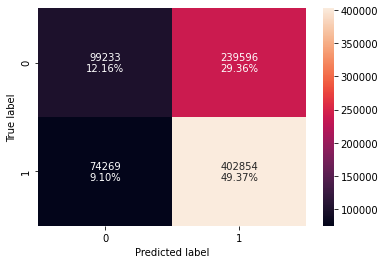

In [0]:
confusion_matrix_sklearn(grid_result, X_train, y_train)

In [0]:
# Testing on Train set
dtree_estimator_model_train_perf = model_performance_classification_sklearn(
    grid_result, X_train, y_train
)
dtree_estimator_model_train_perf

Out[46]:

,Accuracy,Recall,Precision,F1
0,0.615339,0.84434,0.627059,0.719657


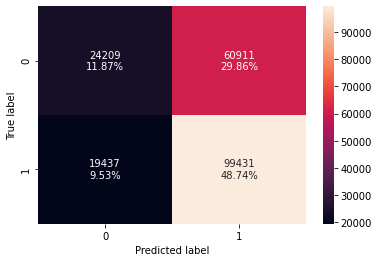

In [0]:
confusion_matrix_sklearn(grid_result, X_test, y_test)

In [0]:
# Testing on Test set
dtree_estimator_model_test_perf = model_performance_classification_sklearn(
    grid_result, X_test, y_test
)
dtree_estimator_model_test_perf

Out[48]:

,Accuracy,Recall,Precision,F1
0,0.606114,0.836482,0.620118,0.712231


In [0]:
# Predict test set and get AUC
probs = grid_result.predict_proba(X_test)
auc = roc_auc_score(y_test, probs[:, 1])
auc

Out[49]: 0.6185843915114916

#### ROC curve & probabilities threshold

Best Threshold=0.578000, G-Mean=0.586

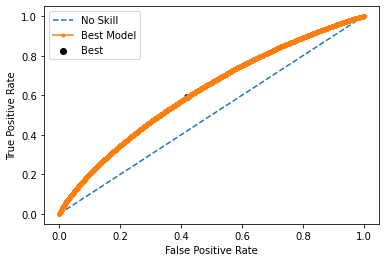

In [0]:
# Source code & explanation: https://machinelearningmastery.com/threshold-moving-for-imbalanced-classification/
# calculate roc curves
fpr, tpr, thresholds = roc_curve(y_test, probs[:, 1])

# calculate the g-mean for each threshold
gmeans = sqrt(tpr * (1-fpr))

# locate the index of the largest g-mean
ix = argmax(gmeans)
print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

# plot the roc curve for the model
pyplot.plot([0,1], [0,1], linestyle='--', label='No Skill')
pyplot.plot(fpr, tpr, marker='.', label='Best Model')
pyplot.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
pyplot.legend()

# show the plot
pyplot.show()

#### Probability Analysis

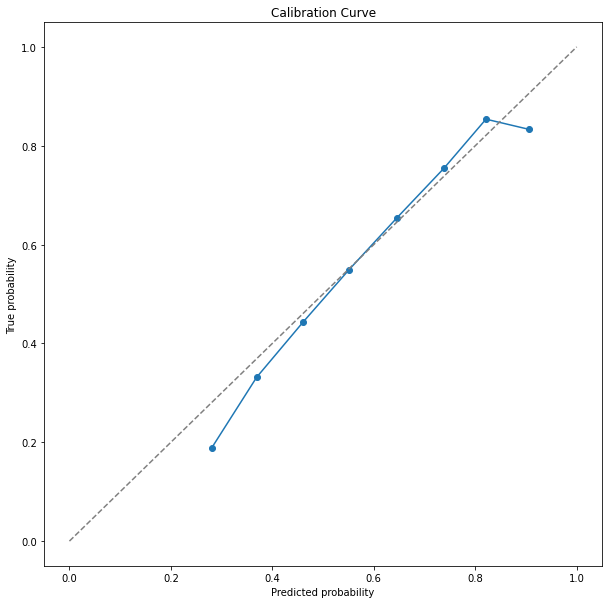

In [0]:
# Generate predicted probabilities for the testing set
y_proba = grid_result.predict_proba(X_train)[:, 1]

# Compute the calibration curve
true_prob, pred_prob = calibration_curve(y_train, y_proba, n_bins=10)

# Plot the calibration curve
plt.figure(figsize =(10, 10))
plt.plot(pred_prob, true_prob, marker='o')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('Predicted probability')
plt.ylabel('True probability')
plt.title('Calibration Curve')
plt.show()

In [0]:
# X_train HHIDs probabilities
X_train_prob = grid_result.predict_proba(X_train)
X_train_prob = pd.DataFrame({'0': X_train_prob[:, 0], '1': X_train_prob[:, 1]})
display(X_train_prob)

0,1
0.63224554,0.36775446
0.37147975,0.62852025
0.33523965,0.66476035
0.58882743,0.41117257
0.33125633,0.66874367
0.43214417,0.56785583
0.44982803,0.550172
0.3560022,0.6439978
0.5163845,0.48361552
0.37844503,0.621555


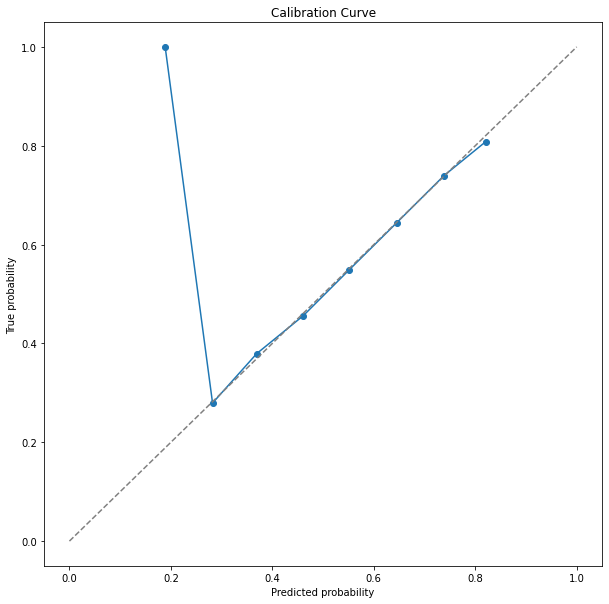

In [0]:
from sklearn.calibration import calibration_curve

# Generate predicted probabilities for the testing set
y_proba_uncalibrated = grid_result.predict_proba(X_test)[:, 1]

# Compute the calibration curve
true_prob, pred_prob = calibration_curve(y_test, y_proba_uncalibrated, n_bins=10)

# Plot the calibration curve
plt.figure(figsize =(10, 10))
plt.plot(pred_prob, true_prob, marker='o')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('Predicted probability')
plt.ylabel('True probability')
plt.title('Calibration Curve')
plt.show()

In [0]:
grid_result.classes_ 

Out[54]: array([0, 1])

In [0]:
#X_test HHIDs probabilities
X_test_prob = grid_result.predict_proba(X_test)
X_test_prob = pd.DataFrame({'0': X_test_prob[:, 0], '1': X_test_prob[:, 1]})
display(X_test_prob)

0,1
0.38097125,0.61902875
0.4847309,0.5152691
0.53989375,0.46010628
0.46178758,0.5382124
0.4081887,0.5918113
0.3753565,0.6246435
0.1898616,0.8101384
0.36921716,0.63078284
0.35004395,0.64995605
0.38989562,0.6101044


#### Top features

In [0]:
# Extract feature coefficients and calculate importance
feature_importance = grid_result.feature_importances_
sorted_idx = np.argsort(feature_importance)

# Print coefficients & feature importance
out_tuples = list(zip(np.array(X_train.columns)[sorted_idx],  feature_importance[sorted_idx]))
display(pd.DataFrame(out_tuples, columns=['Feature','Importance']))

Feature,Importance
COMPETITION_DOLLAR_AT_RISK,0.009980624541640282
OFFERINGS_SERVICE_COUNTER_SALES_MIX_PER,0.010525168851017952
OWN_BRANDS_OWN_BRANDS_SALES_MIX_PER,0.011849785223603249
PRIOR_3MO_PRODUCE,0.012964981608092785
MARKDOWN_MARKDOWN_PER,0.01360937301069498
ECOM_AOV,0.01416855864226818
PRIOR_3MO_OWN_BRANDS_PERC,0.014237107709050179
PRIOR_3MO_FLORAL,0.01438450813293457
IRI_SALES_SALES_DOLLAR_TY,0.014506295323371887
ETHNICITY_ASIAN_STORE_PER,0.015940319746732712


In [0]:
# Print top ten important features
top_feature_df = pd.DataFrame(out_tuples, columns=['Feature','Importance'])
top10_feature_df = top_feature_df.sort_values(by = 'Importance', ascending = False).head(30)
top10_features = top10_feature_df['Feature'].values
group = dummy_data.groupby("ECOM_CHURN_FLAG").mean()
group[top10_features].reset_index()

Out[57]:

,ECOM_CHURN_FLAG,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_CONVENIENCE SEEKERS,FRST_TXN_CLIPPED_COUPONS,PRIOR_3_MONTH_STORE_AOV,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_One-Stop Low Price,PRIOR_3_MONTHS_COUPONS_CLIPPED,FRST_TXN_TRUPRICE_SEGMENT_Most Quality Driven,FRST_TXN_TRUPRICE_SEGMENT_Most Price Driven,FRST_TXN_SHOP_STYLE_SEG_SEGMENT_COOKING FROM SCRATCH,Income_UND50K_Low_q_3,Income_150K_VeryHigh_q_3,PRIOR_3_MONTH_MKDN_AMT,LENGTH_OF_TIME_WD_ALB_DAYS,ECOMM_DUG_HH_MIX_PER,DIGITALLY_REACHABLE_FLAG_true,ECOMM_HOME_DELIVERY_MIX_PER,Age35+_55_Medium_q_3,PHARMACY_true,ETHNICITY_ASIAN_STORE_PER,IRI_SALES_SALES_DOLLAR_TY,PRIOR_3MO_FLORAL,PRIOR_3MO_OWN_BRANDS_PERC,ECOM_AOV,MARKDOWN_MARKDOWN_PER,PRIOR_3MO_PRODUCE,OWN_BRANDS_OWN_BRANDS_SALES_MIX_PER,OFFERINGS_SERVICE_COUNTER_SALES_MIX_PER,COMPETITION_DOLLAR_AT_RISK
0,False,0.237937,5.388430,51.044870,0.051601,68.342425,0.177807,0.123534,0.166239,0.346216,0.319878,-10.282705,2098.498114,0.020091,0.686354,0.011637,0.327105,0.815792,0.061191,1.008725e+07,1.000592,21.313344,94.566922,0.157639,10.394649,0.234477,0.015995,7.745345e+07
1,True,0.189855,4.215481,41.166151,0.076332,53.259875,0.151699,0.108653,0.171927,0.324169,0.342905,-8.769911,2193.784311,0.018808,0.668472,0.011012,0.337763,0.820761,0.065922,9.952515e+06,1.118127,20.233664,94.263418,0.156622,9.934868,0.233870,0.015857,7.861709e+07


In [0]:
top10_features

Out[58]: array(['FRST_TXN_SHOP_STYLE_SEG_SEGMENT_CONVENIENCE SEEKERS',
 'FRST_TXN_CLIPPED_COUPONS', 'PRIOR_3_MONTH_STORE_AOV',
 'FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN_One-Stop Low Price',
 'PRIOR_3_MONTHS_COUPONS_CLIPPED',
 'FRST_TXN_TRUPRICE_SEGMENT_Most Quality Driven',
 'FRST_TXN_TRUPRICE_SEGMENT_Most Price Driven',
 'FRST_TXN_SHOP_STYLE_SEG_SEGMENT_COOKING FROM SCRATCH',
 'Income_UND50K_Low_q_3', 'Income_150K_VeryHigh_q_3',
 'PRIOR_3_MONTH_MKDN_AMT', 'LENGTH_OF_TIME_WD_ALB_DAYS',
 'ECOMM_DUG_HH_MIX_PER', 'DIGITALLY_REACHABLE_FLAG_true',
 'ECOMM_HOME_DELIVERY_MIX_PER', 'Age35+_55_Medium_q_3',
 'PHARMACY_true', 'ETHNICITY_ASIAN_STORE_PER',
 'IRI_SALES_SALES_DOLLAR_TY', 'PRIOR_3MO_FLORAL',
 'PRIOR_3MO_OWN_BRANDS_PERC', 'ECOM_AOV', 'MARKDOWN_MARKDOWN_PER',
 'PRIOR_3MO_PRODUCE', 'OWN_BRANDS_OWN_BRANDS_SALES_MIX_PER',
 'OFFERINGS_SERVICE_COUNTER_SALES_MIX_PER',
 'COMPETITION_DOLLAR_AT_RISK'], dtype=object)

#### Visualization of best model index

In [0]:
# The model's training mean
print(grid_result.predict(X_train).mean().round(4))

0.7874

<IPython.core.display.HTML object>

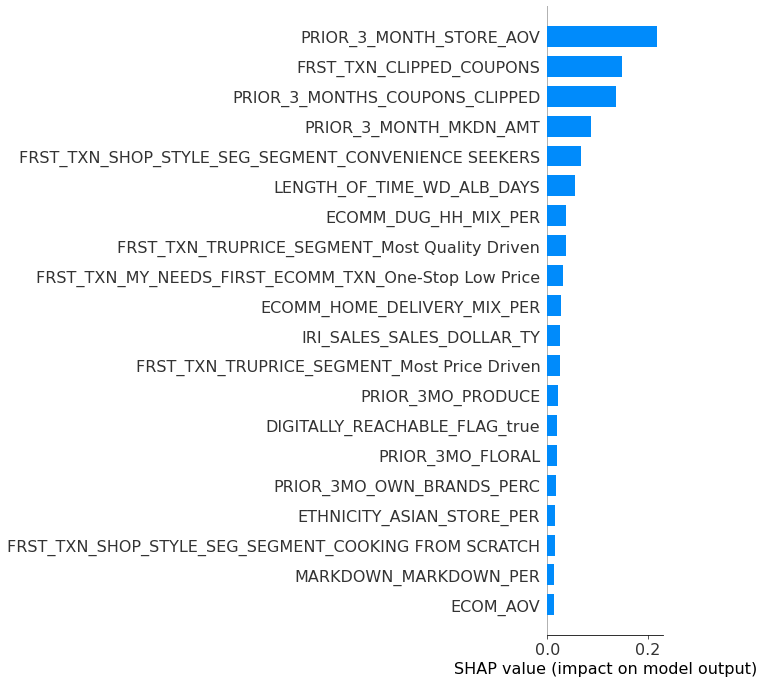

In [0]:
explainer = shap.TreeExplainer(grid_result)
shap_values = explainer.shap_values(X_train)
shap.initjs()

shap.summary_plot(shap_values, X_train, plot_type = 'bar',  max_display=20, show=False)

# Get the current figure and axes objects. from @GarrettCGraham code
fig, ax = plt.gcf(), plt.gca()

# Modifying main plot parameters
ax.tick_params(labelsize=16)
ax.set_xlabel("SHAP value (impact on model output)", fontsize=16)

plt.show()

0%| | 3306/815952 [00:11<45:03]  0%| | 3609/815952 [00:12<45:01]  0%| | 3910/815952 [00:13<44:59]  1%| | 4222/815952 [00:14<44:51]  1%| | 4538/815952 [00:15<44:42]  1%| | 4853/815952 [00:16<44:34]  1%| | 5157/815952 [00:17<44:32]  1%| | 5481/815952 [00:18<44:21]  1%| | 5795/815952 [00:19<44:16]  1%| | 6098/815952 [00:20<44:16]  1%| | 6403/815952 [00:21<44:15]  1%| | 6712/815952 [00:22<44:12]  1%| | 7017/815952 [00:23<44:11]  1%| | 7324/815952 [00:24<44:09]  1%| | 7642/815952 [00:25<44:04]  1%| | 7952/815952 [00:26<44:01]  1%| | 8261/815952 [00:27<43:59]  1%| | 8569/815952 [00:28<43:58]  1%| | 8879/815952 [00:29<43:56]  1%| | 9196/815952 [00:30<43:51]  1%| | 9508/815952 [00:31<43:49]  1%| | 9806/815952 [00:32<43:50]  1%| | 10114/815952 [00:33<43:49]  1%| | 10424/815952 [00:34<43:47]  1%| | 10735/815952 [00:35<43:45]  1%| | 11047/815952 [00:36<43:43]  1%| | 11367/815952 [00:37<43:38]  1%| | 11668/815952 [00:38<43:39]  1%| | 11978/815952 [00:39<43:37]  2%| | 12294/815952 [00:40<43:34]  2%| | 12608/815952 [00:41<43:32]  2%| | 12917/815952 [00:42<43:31]  2%| | 13228/815952 [00:43<43:29]  2%| | 13533/815952 [00:44<43:28]  2%| | 13841/815952 [00:45<43:27]  2%| | 14134/815952 [00:46<43:29]  2%| | 14436/815952 [00:47<43:29]  2%| | 14745/815952 [00:48<43:28]  2%| | 15055/815952 [00:49<43:26]  2%| | 15363/815952 [00:50<43:25]  2%| | 15670/815952 [00:51<43:24]  2%| | 15979/815952 [00:52<43:23]  2%| | 16296/815952 [00:53<43:20]  2%| | 16611/815952 [00:54<43:18]  2%| | 16920/815952 [00:55<43:17]  2%| | 17228/815952 [00:56<43:16]  2%| | 17538/815952 [00:57<43:14]  2%| | 17846/815952 [00:58<43:13]  2%| | 18163/815952 [00:59<43:11]  2%| | 18474/815952 [01:00<43:10]  2%| | 18792/815952 [01:01<43:07]  2%| | 19104/815952 [01:02<43:06]  2%| | 19419/815952 [01:03<43:04]  2%| | 19741/815952 [01:04<43:01]  2%| | 20051/815952 [01:05<43:00]  2%| | 20353/815952 [01:06<42:59]  3%|= | 20657/815952 [01:07<42:59]  3%|= | 20951/815952 [01:08<43:00]  3%|= | 21261/815952 [01:09<42:59]  3%|= | 21573/815952 [01:10<42:57]  3%|= | 21876/815952 [01:11<42:57]  3%|= | 22181/815952 [01:12<42:56]  3%|= | 22483/815952 [01:13<42:56]  3%|= | 22785/815952 [01:14<42:56]  3%|= | 23098/815952 [01:15<42:54]  3%|= | 23399/815952 [01:16<42:54]  3%|= | 23700/815952 [01:17<42:53]  3%|= | 24004/815952 [01:18<42:53]  3%|= | 24323/815952 [01:19<42:51]  3%|= | 24630/815952 [01:20<42:50]  3%|= | 24940/815952 [01:21<42:49]  3%|= | 25250/815952 [01:22<42:47]  3%|= | 25553/815952 [01:23<42:47]  3%|= | 25857/815952 [01:24<42:46]  3%|= | 26165/815952 [01:25<42:45]  3%|= | 26473/815952 [01:26<42:44]  3%|= | 26789/815952 [01:27<42:42]  3%|= | 27097/815952 [01:28<42:41]  3%|= | 27404/815952 [01:29<42:40]  3%|= | 27707/815952 [01:30<42:40]  3%|= | 28020/815952 [01:31<42:38]  3%|= | 28334/815952 [01:32<42:37]  4%|= | 28641/815952 [01:33<42:36]  4%|= | 28953/815952 [01:34<42:35]  4%|= | 29270/815952 [01:35<42:33]  4%|= | 29588/815952 [01:36<42:31]  4%|= | 29892/815952 [01:37<42:30]  4%|= | 30194/815952 [01:38<42:30]  4%|= | 30500/815952 [01:39<42:29]  4%|= | 30813/815952 [01:40<42:28]  4%|= | 31125/815952 [01:41<42:26]  4%|= | 31436/815952 [01:42<42:25]  4%|= | 31746/815952 [01:43<42:24]  4%|= | 32072/815952 [01:44<42:21]  4%|= | 32381/815952 [01:45<42:20]  4%|= | 32706/815952 [01:46<42:18]  4%|= | 33031/815952 [01:47<42:16]  4%|= | 33345/815952 [01:48<42:14]  4%|= | 33662/815952 [01:49<42:13]  4%|= | 33972/815952 [01:50<42:12]  4%|= | 34288/815952 [01:51<42:10]  4%|= | 34602/815952 [01:52<42:09]  4%|= | 34909/815952 [01:53<42:08]  4%|= | 35219/815952 [01:54<42:07]  4%|= | 35525/815952 [01:55<42:06]  4%|= | 35834/815952 [01:56<42:05]  4%|= | 36153/815952 [01:57<42:03]  4%|= | 36466/815952 [01:58<42:02]  5%|= | 36779/815952 [01:59<42:01]  5%|= | 37089/815952 [02:00<41:59]  5%|= | 37403/815952 [02:01<41:58]  5%|= | 37718/815952 [02:02<41:57]  5%|= | 38030/815952 [02:03<41:56]  5%|= | 383

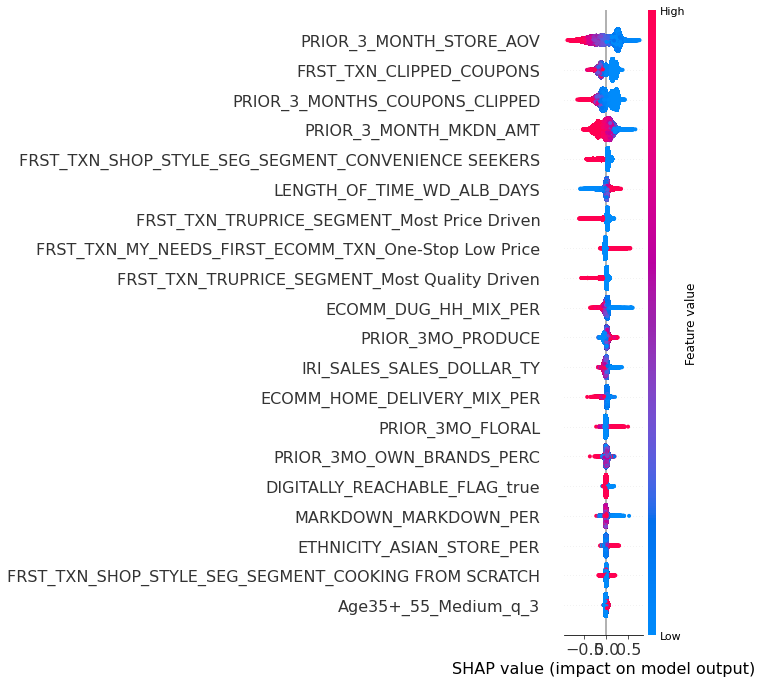

In [0]:
# Create a tree explainer
xgb_explainer = shap.TreeExplainer(
    grid_result, X_train, feature_names=X_train.columns.tolist()
)

# Shap values with tree explainer
shap_values = xgb_explainer.shap_values(X_train, y_train)
#shap.summary_plot(shap_values, X_train, max_display=20)

shap.summary_plot(shap_values, X_train, max_display=20, show=False)

# Get the current figure and axes objects. from @GarrettCGraham code
fig, ax = plt.gcf(), plt.gca()

# Modifying main plot parameters
ax.tick_params(labelsize=16)
ax.set_xlabel("SHAP value (impact on model output)", fontsize=16)

plt.show()

In [0]:
from joblib import Parallel, delayed
import joblib
  
# Save the model as a pickle in a file
joblib.dump(grid_result, '/dbfs/FileStore/Models/BNC_to_eCom.pkl')

Out[62]: ['/dbfs/FileStore/Models/BNC_to_eCom.pkl']

## 2.e EDA of Top Features

In [0]:
pd_df.head()

Out[88]:

,ECOM_CHURN_FLAG,FRST_TXN_MY_NEEDS_FIRST_ECOMM_TXN,FRST_TXN_SHOP_STYLE_SEG_SEGMENT,FRST_TXN_TRUPRICE_SEGMENT,PRIOR_3_MONTH_STORE_AOV,PRIOR_3_MONTHS_COUPONS_CLIPPED,PRIOR_3_MONTH_MKDN_AMT,STORE_AOV_3MO,PRIOR_3_MONTH_TOTAL_NET_SALES,STORE_AVG_MKDN_AMT_3MO,PRIOR_3MO_PRODUCE,PRIOR_3MO_DAIRY,PRIOR_3MO_GROCERY,PRIOR_3MO_FLORAL,PRIOR_3MO_ALCOHOLIC_BEVERAGES,PRIOR_3MO_OWN_BRANDS_PERC,PRIOR_3MO_BAKERY_PKD_OUTSIDE,PRIOR_3MO_MEAT,PRIOR_3MO_FRESH_SALES_PERC,ECOMM_DUG_HH_MIX_PER,ETHNICITY_ASIAN_STORE_PER,ECOMM_HOME_DELIVERY_MIX_PER,IRI_SALES_SALES_DOLLAR_TY,OWN_BRANDS_OWN_BRANDS_SALES_MIX_PER,OFFERINGS_SERVICE_COUNTER_SALES_MIX_PER,Age35+_55_Medium_q,IRI_SALES_SALES_PER_CHANGE,ECOM_AOV,ETHNICITY_HISPANIC_STORE_PER,MARKDOWN_MARKDOWN_PER,HH_COUNTS_HH_COUNT_TY,COMPETITION_DOLLAR_AT_RISK,AVG_SOOS,Income_UND50K_Low_q,SIGNED_IN_VISITS,ITEM_ORDERED_TIME,SEARCH_TIME,CART_ADDING_VISITS_PER_VISITS,LOCATION_FLAG,AISLES_TIME,ERROR_VISIT_FLAG,PD_ENGAGEMENT,COUPON_REDEMPTIONS,GR_CLIPS,PDP_TIME,MEAL_PLAN_FLAG,FRST_TXN_ORDERED,TIMEGAP_ACQ_SHOP,FRST_TXN_CLIPPED_COUPONS,OTD_FLAG,FRST_TXN_PRE_SUB_OOS,DIGITALLY_REACHABLE_FLAG,FRST_TXN_TOTAL_REFUND_AMT,FRST_TXN_DELIVERY_FEE_AMT,NPS_CUSTOMER,BASKET_HEALTH_METRIC,FRST_TXN_OTT,FRST_TXN_OOS_PER,FRST_TXN_DRIVE_DISTANCE_CAT,FRST_TXN_ORDER_CREATED_DEVICE,FRST_TXN_NET_SALES,FRST_TXN_FRESH_PASS_HHS,FRST_TXN_GROCERY,FRST_TXN_PAYMENT_METHODS,FRST_TXN_SAVE30_PROMO_CODE_FLAG,FRST_TXN_DAIRY_FLAG,FRST_TXN_PRODUCE_FLAG,FRST_TXN_FROZEN_GROCERY,FRST_TXN_AIV,FRST_TXN_MKDN_AMT,STORE_INTERACTION_48HRS_FLAG,FRST_TXN_FRESH_SALES_PERC,FRST_TXN_MEAT_FLAG,FRST_TXN_PROMO_CODE_FLAG,CHECKOUT_TIME,FRST_TXN_DELIVERY_DELAY,MEAL_PLAN_FAV
0,False,One-Stop Low Price,FAMILY FOCUSED,Price Neutral,0.00000,6.0,0.000000,56.093334,0.00,-16.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010,0.02,0.000,7054674.0,0.24,0.014,False,0.02,81.123400,0.15,0.20,52784.0,62408164.0,0.004193,3,2.0,10.0,18.0,0.5000,True,0.0,True,0.5000,0.0,0.0,0.0,0,6.0,1078.0,0.0,NA,0.000000,true,0.0,Others,NA,A - PERFECT,true,0.000000,NA,APP,79.94,false,0.000000,cc,true,false,false,0.000000,13.323334,-36.00,0,0.000000,false,true,21.0,0.0,false
1,True,Scratch Foodies,UNCLASSIFIED,UNCLASSIFIED,0.00000,1.0,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.039,0.02,0.014,15157297.0,0.20,0.023,3,0.09,94.413640,0.14,0.19,38008.0,84317064.0,0.566961,False,2.0,8.0,0.0,0.3333,False,0.0,False,0.0000,1.0,0.0,41.0,0,7.0,1000.0,0.0,True,14.285715,false,0.0,5.95,NA,D - NEEDS_IMPROVEMENT,true,0.142857,Drive_Distance_5+,APP,36.82,false,7.930060,cc,false,true,true,0.000000,4.091111,-11.06,0,70.823030,true,false,9.0,-121.0,false
2,True,Scratch Foodies,CONVENIENTLY FRESH,Most Quality Driven,31.31000,1.0,-2.525714,32.073845,219.17,-4.058462,10.092866,5.897002,20.325031,9.282397,9.282397,20.785141,0.000000,4.216969,24.854368,0.008,0.08,0.000,13237693.0,0.21,0.010,False,0.00,117.100365,0.09,0.16,57934.0,175987712.0,0.072142,False,5.0,2.0,47.0,0.4000,True,0.0,False,0.0000,0.0,0.0,6.0,0,19.0,5380.0,0.0,NA,26.315790,false,0.0,Others,NA,E - POOR,true,0.000000,NA,APP,77.02,false,13.821042,cc,false,true,true,0.000000,3.667619,-7.99,1,70.173790,true,false,13.0,0.0,false
3,True,Chasing Price,CONVENIENCE SEEKERS,Quality Driven,16.90374,8.0,-5.010813,20.604902,2079.16,-5.881667,6.656353,7.759777,29.307817,0.000000,23.306547,10.386317,5.246396,5.483696,20.676664,0.031,0.02,0.000,15254579.0,0.28,0.016,False,0.01,111.904350,0.07,0.16,47051.0,38189528.0,0.496496,3,3.0,3.0,38.0,0.6667,True,0.0,True,1.3333,7.0,0.0,0.0,0,14.0,1334.0,1.0,NA,0.000000,true,0.0,Others,NA,A - PERFECT,true,0.000000,NA,APP,41.61,false,22.864864,cc,false,true,false,22.151352,2.311667,-50.65,1,25.037836,true,false,3.0,0.0,false
4,True,Chasing Price,CONVENIENCE SEEKERS,UNCLASSIFIED,0.00000,6.0,0.000000,14.625000,0.00,-0.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.036,0.02,0.013,10135648.0,0.2

In [0]:
num_cols_to_select = [
'FRST_TXN_ORDERED',
'SIGNED_IN_VISITS',
'PRIOR_3_MONTH_TOTAL_NET_SALES',
'CART_ADDING_VISITS_PER_VISITS',
'TIMEGAP_ACQ_SHOP',
'FRST_TXN_PRE_SUB_OOS',
'ECOMM_DUG_HH_MIX_PER',
'FRST_TXN_CLIPPED_COUPONS',
'SEARCH_TIME',
'FRST_TXN_MKDN_AMT',
'FRST_TXN_DELIVERY_DELAY'
]

cat_cols_to_select = [
'FRST_TXN_SAVE30_PROMO_CODE_FLAG',
'STORE_INTERACTION_48HRS_FLAG',
'FRST_TXN_FRESH_PASS_HHS',
'FRST_TXN_TRUPRICE_SEGMENT',
'FRST_TXN_SHOP_STYLE_SEG_SEGMENT',
'FRST_TXN_PAYMENT_METHODS',
'FRST_TXN_ORDER_CREATED_DEVICE',
'LOCATION_FLAG',
'ERROR_VISIT_FLAG',
'MEAL_PLAN_FAV',
'FRST_TXN_PROMO_CODE_FLAG'
]

all_imp = cat_cols_to_select+num_cols_to_select+['ECOM_CHURN_FLAG']
top_features_df = pd_df[all_imp]
top_features_df.shape

Out[93]: (1019940, 23)

In [0]:
top_features_df['ECOM_CHURN_FLAG'] = top_features_df['ECOM_CHURN_FLAG'].astype(str)

##### Decile Marking excl. 0

In [0]:
result = pd.DataFrame(columns=['Feature_Name','Quartile','Threshold','Total_Count','Churn_Count','Churn_Percentage'])

result = get_decile_mark_v10(top_features_df,num_cols_to_select,result)

display(result)

FRST_TXN_ORDERED
SIGNED_IN_VISITS
PRIOR_3_MONTH_TOTAL_NET_SALES
CART_ADDING_VISITS_PER_VISITS
TIMEGAP_ACQ_SHOP
FRST_TXN_PRE_SUB_OOS
ECOMM_DUG_HH_MIX_PER
FRST_TXN_CLIPPED_COUPONS
SEARCH_TIME
FRST_TXN_MKDN_AMT
FRST_TXN_DELIVERY_DELAY

Feature_Name,Quartile,Threshold,Total_Count,Churn_Count,Churn_Percentage
FRST_TXN_ORDERED,00,0.0,0,0,0.0
FRST_TXN_ORDERED,01,5.0,128974,97185,0.753523966070681
FRST_TXN_ORDERED,02,8.0,98115,63941,0.6516944401977272
FRST_TXN_ORDERED,03,11.0,102960,62382,0.6058857808857809
FRST_TXN_ORDERED,04,14.0,97896,57336,0.5856827653836725
FRST_TXN_ORDERED,05,17.0,96719,55181,0.5705290584063111
FRST_TXN_ORDERED,06,21.0,106978,59429,0.5555254351361962
FRST_TXN_ORDERED,07,25.0,89532,48327,0.5397734888084708
FRST_TXN_ORDERED,08,31.0,99499,52409,0.5267289118483602
FRST_TXN_ORDERED,09,41.0,99982,50936,0.5094517013062351


In [0]:
import plotly.express as px

for i in result['Feature_Name'].unique():

  fig = px.bar(result[(result['Feature_Name'] == i)], x='Quartile', y='Churn_Percentage', text='Churn_Percentage',  title=i, height=300, text_auto='.2%')
  fig.update_yaxes(showgrid=False),
  #fig.update_xaxes(categoryorder='total descending')
  #fig.update_traces(textposition='outside')
  fig.update_traces(textfont_size=20, textangle=0, textposition="outside", cliponaxis=False)
  fig.update_xaxes(categoryorder='array', categoryarray=['00','01','02','03','04','05','06','07','08','09','10'])
  fig.update_traces(hovertemplate=None,)
  fig.update_traces(marker_color='#8ecae6') #E3BC9A
  fig.update_layout(margin=dict(t=100, b=0, l=70, r=40), bargap= 0.5,
                          hovermode="x unified",
                          xaxis_tickangle=360,
                          xaxis_title=' Deciles ', yaxis_title=" CHURN %",
                          #plot_bgcolor='#00CC96', paper_bgcolor='#2d3035',
                          plot_bgcolor='rgba(0, 0, 0, 0)', paper_bgcolor='rgba(0, 0, 0, 0)',
                          title_font=dict(size=25, color='#a5a7ab', family="Lato, sans-serif"),
                          font=dict(color='#000000'),
                            )
                         
  fig.show()

##### Decile qcut

In [0]:
top_features_df_copy = top_features_df.copy()
features = ['SIGNED_IN_VISITS', 'CART_ADDING_VISITS_PER_VISITS', 'FRST_TXN_CLIPPED_COUPONS']
top_features_df_copy = get_decile_mark(top_features_df_copy,features)

In [0]:
agg_result = aggregate_overall(top_features_df_copy,features)
agg_result = agg_result[(agg_result['ECOM_CHURN_FLAG'] == 'True')&(agg_result['Feature_Values'] != 'NA')]
display(agg_result)

Feature_Values,Overall_Category_Count,ECOM_CHURN_FLAG,Ecom_Flag_Count,CHURN_PER,Feature_Name
01,101994,True,69015,0.6766574504382611,SIGNED_IN_VISITS
02,101994,True,64936,0.636664901856972,SIGNED_IN_VISITS
03,101994,True,63337,0.6209875090691609,SIGNED_IN_VISITS
04,101994,True,61378,0.601780496891974,SIGNED_IN_VISITS
05,101994,True,60392,0.5921132615644058,SIGNED_IN_VISITS
06,101994,True,58465,0.5732199933329412,SIGNED_IN_VISITS
07,101994,True,57500,0.5637586524697531,SIGNED_IN_VISITS
08,101994,True,55829,0.5473753358040669,SIGNED_IN_VISITS
09,101994,True,53936,0.5288154205149322,SIGNED_IN_VISITS
10,101994,True,51203,0.5020197266505873,SIGNED_IN_VISITS


In [0]:
import plotly.express as px

for i in agg_result['Feature_Name'].unique():

  fig = px.bar(agg_result[(agg_result['Feature_Name'] == i)], x='Feature_Values', y='CHURN_PER', text='CHURN_PER',  title=i, height=300, text_auto='.2%')
  fig.update_yaxes(showgrid=False),
  #fig.update_xaxes(categoryorder='total descending')
  #fig.update_traces(textposition='outside')
  fig.update_traces(textfont_size=20, textangle=0, textposition="outside", cliponaxis=False)
  fig.update_xaxes(categoryorder='array', categoryarray=['00','01','02','03','04','05','06','07','08','09','10'])
  fig.update_traces(hovertemplate=None,)
  fig.update_traces(marker_color='#8ecae6')
  fig.update_layout(margin=dict(t=100, b=0, l=70, r=40), bargap= 0.5,
                          hovermode="x unified",
                          xaxis_tickangle=360,
                          xaxis_title=' Deciles ', yaxis_title=" CHURN PERC",
                          #plot_bgcolor='#00CC96', paper_bgcolor='#2d3035',
                          plot_bgcolor='rgba(0, 0, 0, 0)', paper_bgcolor='rgba(0, 0, 0, 0)',
                          title_font=dict(size=25, color='#a5a7ab', family="Lato, sans-serif"),
                          font=dict(color='#000000'),
                            )
                         
  fig.show()

In [0]:
result1 = pd.DataFrame(columns=['Feature_Name','Quartile','Threshold','Total_Count','Churn_Count','Churn_Percentage'])

result1 = get_decile_mark_v4(top_features_df,['CART_ADDING_VISITS_PER_VISITS'],result1)

display(result1)

CART_ADDING_VISITS_PER_VISITS

Feature_Name,Quartile,Threshold,Total_Count,Churn_Count,Churn_Percentage
CART_ADDING_VISITS_PER_VISITS,00,0.0,0,0,0.0
CART_ADDING_VISITS_PER_VISITS,01,0.25,325726,181865,0.5583373755856149
CART_ADDING_VISITS_PER_VISITS,02,0.3333,270136,166947,0.6180109278289454
CART_ADDING_VISITS_PER_VISITS,03,0.5,255085,144926,0.5681478722778681
CART_ADDING_VISITS_PER_VISITS,04,1.0,168993,102253,0.6050723994484979


In [0]:
import plotly.express as px

for i in result1['Feature_Name'].unique():

  fig = px.bar(result1[(result1['Feature_Name'] == i)], x='Quartile', y='Churn_Percentage', text='Churn_Percentage',  title=i, height=300, text_auto='.2%')
  fig.update_yaxes(showgrid=False),
  #fig.update_xaxes(categoryorder='total descending')
  #fig.update_traces(textposition='outside')
  fig.update_traces(textfont_size=20, textangle=0, textposition="outside", cliponaxis=False)
  fig.update_xaxes(categoryorder='array', categoryarray=['00','01','02','03','04','05','06','07','08','09','10'])
  fig.update_traces(hovertemplate=None,)
  fig.update_traces(marker_color='#8ecae6') #E3BC9A
  fig.update_layout(margin=dict(t=100, b=0, l=70, r=40), bargap= 0.5,
                          hovermode="x unified",
                          xaxis_tickangle=360,
                          xaxis_title=' Deciles ', yaxis_title=" CHURN %",
                          #plot_bgcolor='#00CC96', paper_bgcolor='#2d3035',
                          plot_bgcolor='rgba(0, 0, 0, 0)', paper_bgcolor='rgba(0, 0, 0, 0)',
                          title_font=dict(size=25, color='#a5a7ab', family="Lato, sans-serif"),
                          font=dict(color='#000000'),
                            )
                         
  fig.show()

##### Density Plots

In [0]:
# takes a couple minutes since SHAP interaction values take a factor of 2 * # features
# more time than SHAP values to compute, since this is just an example we only explain
# the first 2,000 people in order to run quicker
shap_interaction_values = shap.TreeExplainer(grid_result).shap_interaction_values(X_train.iloc[:2000,:])

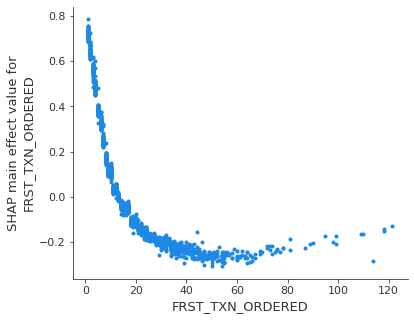

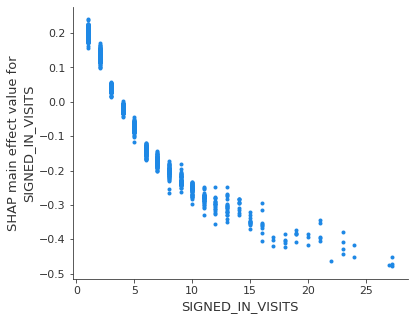

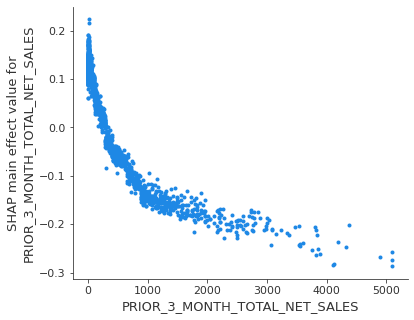

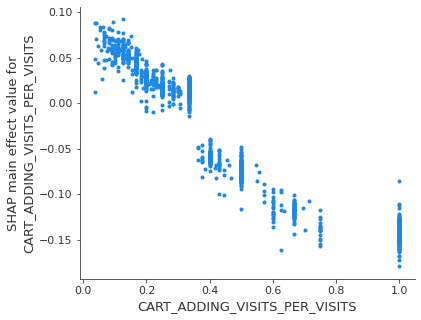

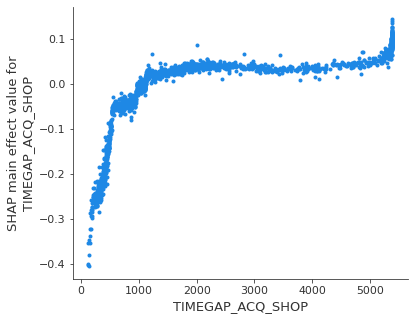

...

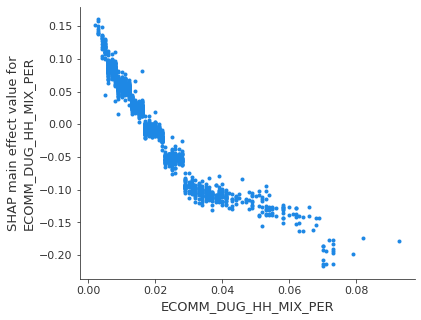

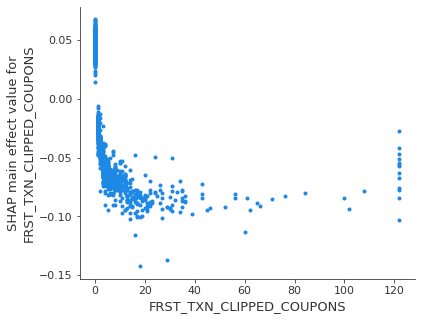

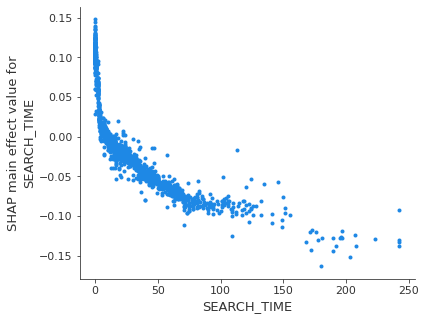

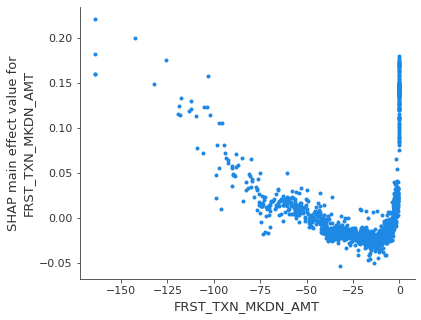

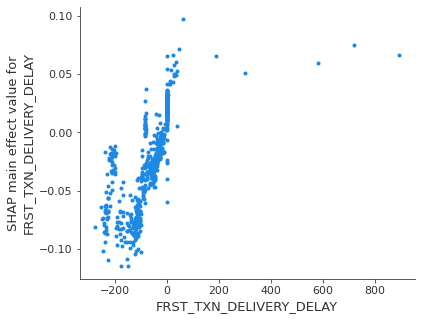

In [0]:
num_cols_inmodel = [col for col in num_cols_to_select if col not in high_corr]
for i in num_cols_inmodel:
  shap.dependence_plot(
      (i, i),
      shap_interaction_values, X_train.iloc[:2000,:]
      ,cmap=shap_values#, xmin=0,xmax=100
  )

##### Discrete features chart

In [0]:
top_features_df_true = top_features_df[top_features_df['ECOM_CHURN_FLAG']=='True']
top_features_df_true.shape

Out[91]: (595991, 22)

In [0]:
categ_dsc = pd.DataFrame(columns=['Feature Name','Feature Values','Value_Count','Churn Count','Churn Percentage'])
c= 0
for x in cat_cols_to_select:
  if c == 0:
    unique_values = top_features_df[x].unique().tolist()
    if len(unique_values) < 25:
      for each_val in unique_values:
        t = top_features_df[top_features_df[x] == each_val]
        t_churn = t[t['ECOM_CHURN_FLAG'] == 'True']
        categ_dsc.loc[len(categ_dsc)] = [str(x), str(each_val), len(t), len(t_churn), len(t_churn)/len(t)]

display(categ_dsc)

Feature Name,Feature Values,Value_Count,Churn Count,Churn Percentage
MEAL_PLAN_FLAG,0,740115,451001,0.6093661120231315
MEAL_PLAN_FLAG,1,279825,144990,0.5181452693647816
FRST_TXN_SAVE30_PROMO_CODE_FLAG,true,114180,76055,0.6660973900858294
FRST_TXN_SAVE30_PROMO_CODE_FLAG,false,905760,519936,0.5740328563857976
STORE_INTERACTION_48HRS_FLAG,0,800870,461886,0.5767303057924507
STORE_INTERACTION_48HRS_FLAG,1,219070,134105,0.6121559318939152
FRST_TXN_FRESH_PASS_HHS,false,969165,578315,0.5967146977036933
FRST_TXN_FRESH_PASS_HHS,true,50775,17676,0.34812407680945345
FRST_TXN_TRUPRICE_SEGMENT,Price Neutral,167678,90784,0.5414186715013299
FRST_TXN_TRUPRICE_SEGMENT,UNCLASSIFIED,224882,163401,0.7266077320550333


In [0]:
import plotly.express as px

for i in categ_dsc['Feature Name'].unique():

  fig = px.bar(categ_dsc[(categ_dsc['Feature Name'] == i)], x='Feature Values', y='Churn Percentage', text='Churn Percentage',  title=i, height=300, text_auto='.2%')
  fig.update_yaxes(showgrid=False),
  #fig.update_xaxes(categoryorder='total descending')
  #fig.update_traces(textposition='outside')
  fig.update_traces(textfont_size=20, textangle=0, textposition="outside", cliponaxis=False)
  fig.update_xaxes(categoryorder='array', categoryarray=['00','01','02','03','04','05','06','07','08','09','10'])
  fig.update_traces(hovertemplate=None,)
  fig.update_traces(marker_color='#8ecae6')
  fig.update_layout(margin=dict(t=100, b=0, l=10, r=30), bargap= 0.5,
                          hovermode="x unified",
                          xaxis_tickangle=360,
                          xaxis_title=' Feature Value ', yaxis_title=" CHURN PERC",
                          #plot_bgcolor='#00CC96', paper_bgcolor='#2d3035',
                          plot_bgcolor='rgba(0, 0, 0, 0)', paper_bgcolor='rgba(0, 0, 0, 0)',
                          title_font=dict(size=25, color='#a5a7ab', family="Lato, sans-serif"),
                          font=dict(color='#000000'),
                            )
                         
  fig.show()

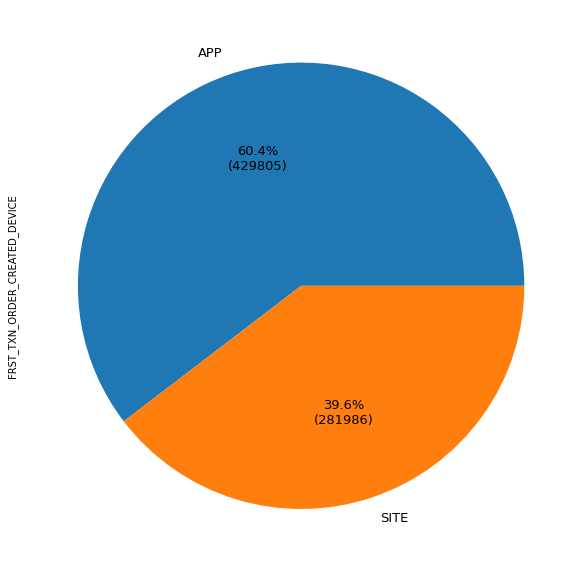

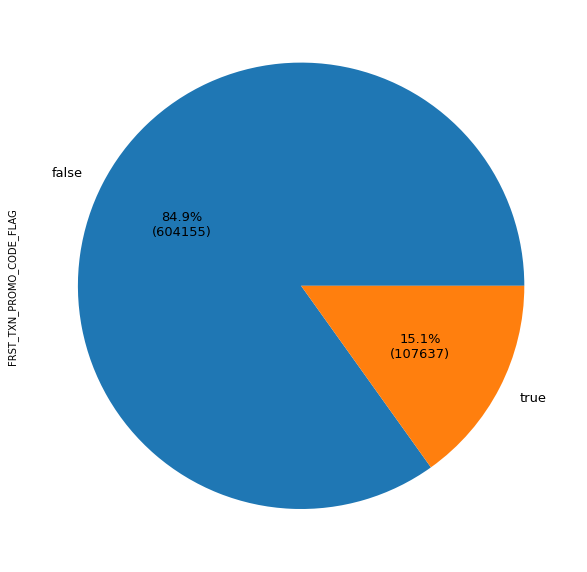

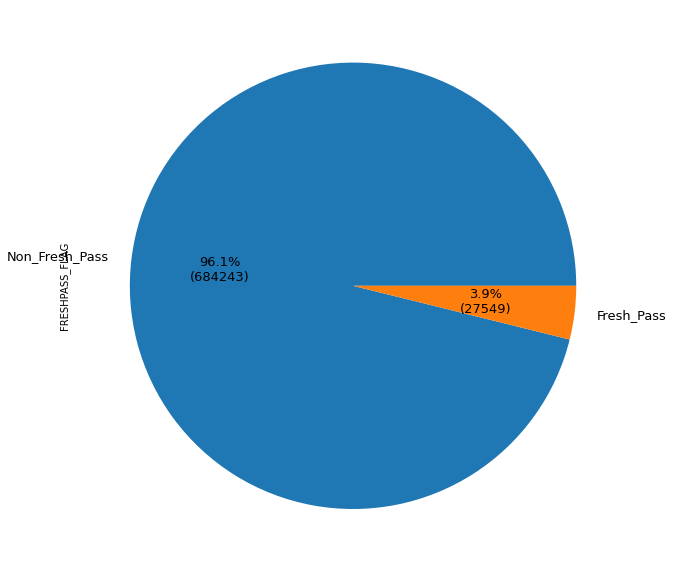

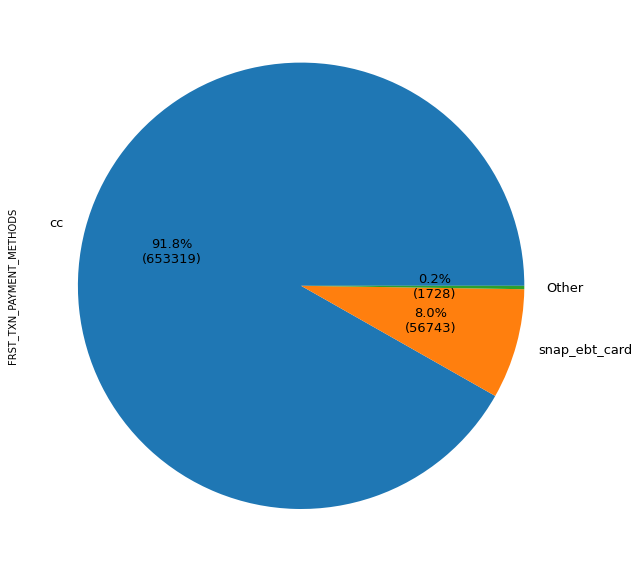

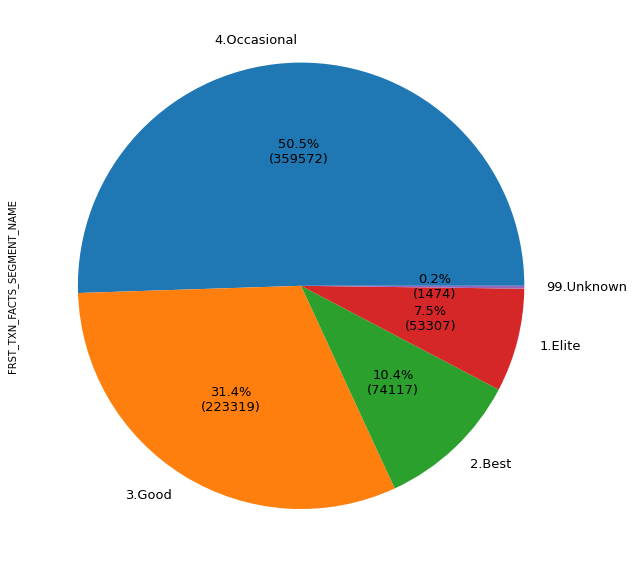

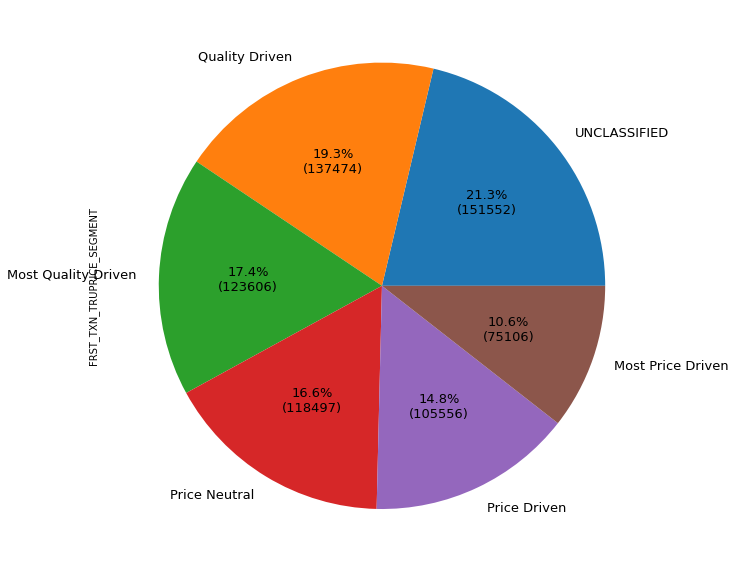

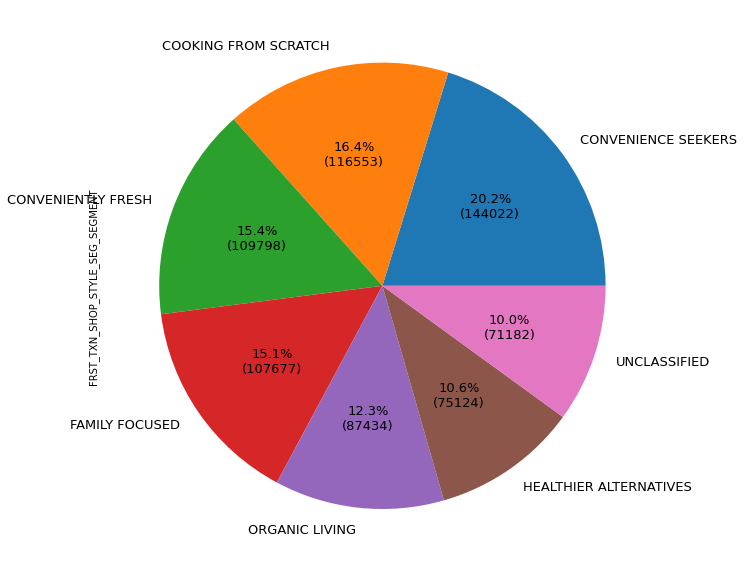

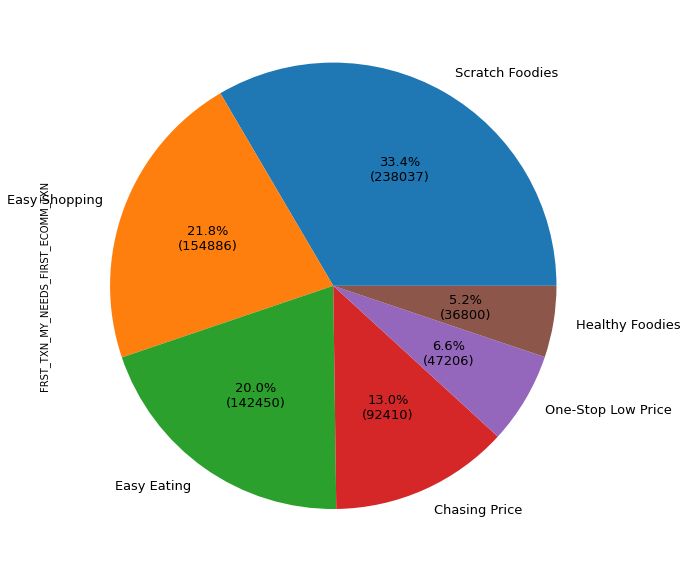

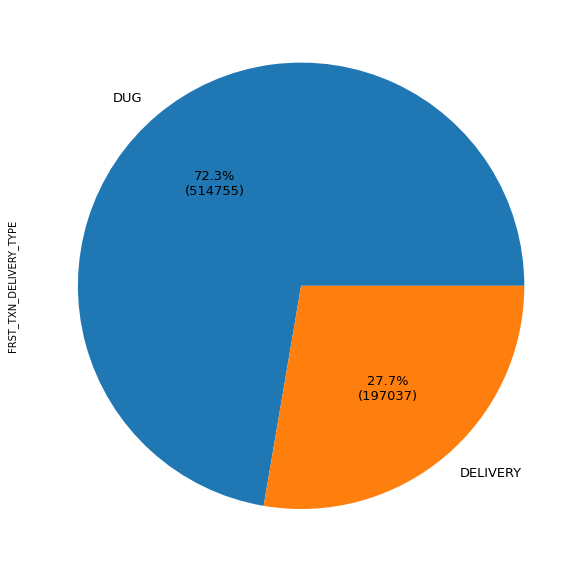

In [0]:
# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}%\n({:d})".format(pct, absolute)

for i in cat_cols_to_select:
  data = top_features_df[i].value_counts()

  plt.figure(figsize = (10,15))
  top_features_df[i].value_counts().plot(kind='pie', y=i, autopct=lambda pct: func(pct, data), textprops = {"fontsize":13})
plt.show() 

In [0]:
categ_dsc = pd.DataFrame(columns=['Feature Name','Feature Values','Value_Count','Churn Count','Churn Percentage'])
c= 0
for x in del_c:
  if c == 0:
    unique_values = top_features_df_dlvry[x].unique().tolist()
    if len(unique_values) < 25:
      for each_val in unique_values:
        t = top_features_df_dlvry[top_features_df_dlvry[x] == each_val]
        t_churn = t[t['ECOM_CHURN_FLAG'] == 'True']
        categ_dsc.loc[len(categ_dsc)] = [str(x), str(each_val), len(t), len(t_churn), len(t_churn)/len(t)]

display(categ_dsc)

Feature Name,Feature Values,Value_Count,Churn Count,Churn Percentage
SCORE_OTD,00,188353,105139,0.5582018868826087
SCORE_OTD,03,1736,976,0.5622119815668203
SCORE_OTD,05,4051,2393,0.5907183411503333
SCORE_OTD,02,1011,560,0.5539070227497527
SCORE_OTD,04,1581,897,0.5673624288425048
SCORE_OTD,01,306,168,0.5490196078431373


In [0]:
import plotly.express as px

for i in categ_dsc['Feature Name'].unique():

  fig = px.bar(categ_dsc[(categ_dsc['Feature Name'] == i)], x='Feature Values', y='Churn Percentage', text='Churn Percentage',  title=i, height=300, text_auto='.2%')
  fig.update_yaxes(showgrid=False),
  #fig.update_xaxes(categoryorder='total descending')
  #fig.update_traces(textposition='outside')
  fig.update_traces(textfont_size=20, textangle=0, textposition="outside", cliponaxis=False)
  fig.update_xaxes(categoryorder='array', categoryarray=['00','01','02','03','04','05','06','07','08','09','10'])
  fig.update_traces(hovertemplate=None,)
  fig.update_traces(marker_color='#E3BC9A')
  fig.update_layout(margin=dict(t=100, b=0, l=70, r=40), bargap= 0.5,
                          hovermode="x unified",
                          xaxis_tickangle=360,
                          xaxis_title=' Feature Value ', yaxis_title=" CHURN PERC",
                          #plot_bgcolor='#00CC96', paper_bgcolor='#2d3035',
                          plot_bgcolor='rgba(0, 0, 0, 0)', paper_bgcolor='rgba(0, 0, 0, 0)',
                          title_font=dict(size=25, color='#a5a7ab', family="Lato, sans-serif"),
                          font=dict(color='#000000'),
                            )
                         
  fig.show()

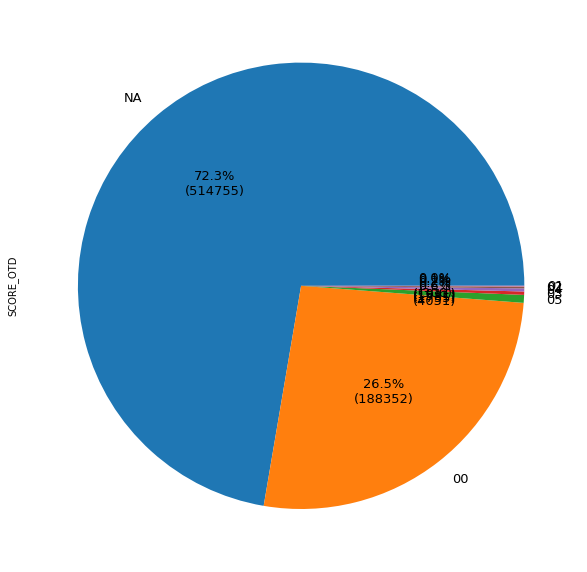

In [0]:
# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}%\n({:d})".format(pct, absolute)

for i in del_c:
  data = top_features_df[i].value_counts()

  plt.figure(figsize = (10,15))
  top_features_df[i].value_counts().plot(kind='pie', y=i, autopct=lambda pct: func(pct, data), textprops = {"fontsize":13})
plt.show() 